## <center>**Inteligencia Artificial Aplicada**</center>
<h3><center>Course Project - Heart Disease Prediction</center></h3>


**Participantes:** 
- Julian Rodriguez Di Sipio
- Lucas Argento
- María Valentina Goyeneche Alvarado
- Alexandra Lozano Salazar

**Docente:**
- Luis Jose Talavera Mendez

**Link al Dataset**
- https://www.kaggle.com/datasets/kamilpytlak/personal-key-indicators-of-heart-disease

## 0. **Explicación de Variables**

*   Heart Disease: Respondents that have ever reported having coronary heart disease (CHD) or myocardial infarction (MI) - Target Variable
*   BMI: Body Mass Index
*   Smoking: Have you smoked at least 100 cigarettes in your entire life? [Note: 5 packs = 100 cigarettes]
*   Alcohol Drinking: Heavy drinkers (adult men having more than 14 drinks per week and adult women having more than 7 drinks per week
*   Stroke: Have you ever had a stroke?
*   Physical Health: Now thinking about your physical health, which includes physical illness and injury, for how many days during the past 30
*   Mental Health: Thinking about your mental health, for how many days during the past 30 days was your mental health not good?
*   Difficulty Walking:Do you have serious difficulty walking or climbing stairs?
*   Sex: Are you male or female?
*   Age Category: Four-level age category
*   Race: Imputed race/etnicity
*   Diabetic: Have you even benn told you are diabetic?
*   Physical Activity: Adults who reported doing physical activity or exercise during the past 30 days other than their regular job
*   Gen Health: Would you say that in general your health is good, very good , poor...
*   Sleep Time: On average, how many hours of sleep do you get in a 24-hour period?
*   Asthma: do you have asthma?
*   Kidney Disease: Not including kidney stones, bladder infection or incontinence, were you ever told you had kidney disease?
*   Skin Cancer: Ever had skin cancer?

## 1. **Imports y funciones que vamos a usar para el analisis exploratorio**

Librerias utilizadas:

- pandas
- numpy
- seaborn 
- matplotlib
- seaborn
- plotly
- sklearn


In [ ]:
import numpy as np
import pandas as pd
import sklearn
import matplotlib.pyplot as plt
import seaborn as sns
import  plotly.express  as  px
import plotly.graph_objects as go
from google.colab import drive
import statsmodels.api as sm
import pylab 
import scipy.stats as stats
from sklearn.model_selection import train_test_split
from sklearn.impute import KNNImputer
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler

In [ ]:
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
df = pd.read_csv('drive/My Drive/heart_2020_cleaned.csv', header=0)

### **Functions**

In [ ]:
def barrassup(Y):
  stackdf = pd.DataFrame()
  totals = df.groupby(Y).agg({"HeartDisease":"count"})["HeartDisease"].tolist() # contar cuenta los ceros tambien -> total casos
  positives = df.groupby(Y).agg({"HeartDisease":"sum"})["HeartDisease"].tolist() # como la categoria positive = 1, sumar cuenta los positivos
  negatives = []
  percentages = []
  for x in totals:
    negatives.append(x-positives[totals.index(x)])

  for x in totals:
    # porcentaje de positivos para la clase x 
    per_clase = [round(positives[totals.index(x)]/totals[totals.index(x)], 2) *100, round(negatives[totals.index(x)]/totals[totals.index(x)], 2)*100]
    percentages.append(per_clase)
    
    # porcentaj de negativos para la clase x 
  stackdf["Positives"] = df.groupby(Y).agg({"HeartDisease":"sum"})["HeartDisease"]
  stackdf["Negatives"] = negatives
  stackdf["Totals"] = totals
  print(stackdf)
  print("\n")
  stackdf['Positives'].plot(kind='bar',label='Yes',color='blue')
  stackdf['Negatives'].plot(kind='bar',label='No',color='orange',bottom=stackdf['Positives'])
  plt.title(Y.upper())
  plt.ylabel('Ocurrencias')
  plt.legend()

In [ ]:
def stacked_bar_plot(column_name, target_variable):
    # Create a new DataFrame with the count of each value in the specified column
    counts = df.groupby([column_name, target_variable]).size().unstack(target_variable, fill_value=0)
    counts = counts.apply(lambda x: x/x.sum(), axis=1)*100
    # Plot the stacked bar graph
    ax = counts.plot(kind='bar', stacked=True, figsize=(10, 6), edgecolor='none')
    ax.set_xlabel(column_name)
    ax.set_ylabel('Percentage')
    ax.set_xticklabels(counts.index, rotation=0)

    # Add percentage labels to the bars
    for i in ax.containers:
        ax.bar_label(i, label_type='center', fontsize=10, labels=[f'{val:.2f}%' for val in i.datavalues])

    plt.show()

In [ ]:
def stacked_bar_chart_with_percentages(df, column, target_variable):
    """
    Given a data frame, a column, and a target variable, plots a stacked bar chart with
    percentages labels of the target variable for each value of the passed column.
    """
    # Group the data by the column and target variable, and calculate the counts and percentages
    grouped_data = df.groupby([column, target_variable]).size().reset_index(name='counts')
    grouped_data['percentage'] = grouped_data.groupby(column)['counts'].apply(lambda x: round(100 * x / x.sum(),2))
    
    # Plot the stacked bar chart
    fig = px.bar(grouped_data, x=column, y='percentage', color=target_variable, barmode='stack',
                 text='percentage', labels={'percentage': 'Percentage (%)', column: column.capitalize()})
    
    # Update the layout
    fig.update_layout(title=f'Stacked Bar Chart of {target_variable.capitalize()} by {column.capitalize()}',
                      xaxis=dict(title=column.capitalize()), yaxis=dict(title='Percentage (%)'))
    
    # Show the plot
    fig.show()

In [ ]:
def analyze_numerical(df, analisis, target):
    av = df[analisis]
    
    # basic description
    print("\n> Description for ", analisis, "\n")
    print(av.describe())
    
    # histogram
    print("\n> Histogram: \n")
    fig = px.histogram(av, labels={'value': 'Data', 'count': 'Frequency'})
    fig.show()
    
    # boxplot
    print("\n> Boxplot: \n")
    fig = px.box(av)
    fig.show() 
    
    # compare to target var, we use a stacked bar approach since target is categorical
    print("\n>", analisis, "VS.", target, "\n")
    fig = px.scatter(df, x=analisis, color=target)
    fig.show()
    
    print("\n>", analisis, "VS.", target, "- Histograma x Pos= RED / Neg = GREEN \n")
    color_map = {'Yes': 'red', 'No': 'green'}

    # Create the histogram
    fig, ax = plt.subplots()
    for color, group in df[[analisis, target]].groupby(target):
        group.plot.hist(ax=ax, alpha=0.5, label=color, color=color_map[color])

    # Set the axis labels and legend
    ax.set_xlabel('Value')
    ax.set_ylabel('Frequency')
    ax.legend(title='Stroke')

    # Show the plot
    plt.show()

In [ ]:
def analyze_categorical(df, analisis, target):
    av = df[analisis]
    
    # basic description
    print("\n> Description for ", analisis, "\n")
    print(av.describe())
    
    # bar charts
    print("\n> Bar Chart - Absolute values: \n")
    counts = av.value_counts(normalize=False)
    fig = px.bar(x=counts.index, y=counts.values)
    fig.update_layout(yaxis_title='Count')
    fig.update_layout(xaxis_title=analisis)
    fig.update_traces(texttemplate='%{y}', textposition='inside')
    fig.show()
    
    # Pie Charts
    print("\n> Pie Chart - Relative %: \n")
    percentages = av.value_counts(normalize=True) * 100
    fig = go.Figure(data=[go.Pie(labels=percentages.index, values=percentages.values)])
    fig.show()
    
    # Compare to target var, we use a stacked bar approach since target is categorical
    print("\n>", analisis, "VS.", target, "\n")    
    stacked_bar_chart_with_percentages(df, analisis, target)

## 2. **Primer Analisis de los Datos**

In [ ]:
df.head()

,HeartDisease,BMI,Smoking,AlcoholDrinking,Stroke,PhysicalHealth,MentalHealth,DiffWalking,Sex,AgeCategory,Race,Diabetic,PhysicalActivity,GenHealth,SleepTime,Asthma,KidneyDisease,SkinCancer
0,No,16.60,Yes,No,No,3.0,30.0,No,Female,55-59,White,Yes,Yes,Very good,5.0,Yes,No,Yes
1,No,20.34,No,No,Yes,0.0,0.0,No,Female,80 or older,White,No,Yes,Very good,7.0,No,No,No
2,No,26.58,Yes,No,No,20.0,30.0,No,Male,65-69,White,Yes,Yes,Fair,8.0,Yes,No,No
3,No,24.21,No,No,No,0.0,0.0,No,Female,75-79,White,No,No,Good,6.0,No,No,Yes
4,No,23.71,No,No,No,28.0,0.0,Yes,Female,40-44,White,No,Yes,Very good,8.0,No,No,No


In [ ]:
df.dtypes

HeartDisease         object
BMI                 float64
Smoking              object
AlcoholDrinking      object
Stroke               object
PhysicalHealth      float64
MentalHealth        float64
DiffWalking          object
Sex                  object
AgeCategory          object
Race                 object
Diabetic             object
PhysicalActivity     object
GenHealth            object
SleepTime           float64
Asthma               object
KidneyDisease        object
SkinCancer           object
dtype: object

In [ ]:
df.describe(include='all')

,HeartDisease,BMI,Smoking,AlcoholDrinking,Stroke,PhysicalHealth,MentalHealth,DiffWalking,Sex,AgeCategory,Race,Diabetic,PhysicalActivity,GenHealth,SleepTime,Asthma,KidneyDisease,SkinCancer
count,319795,319795.000000,319795,319795,319795,319795.00000,319795.000000,319795,319795,319795,319795,319795,319795,319795,319795.000000,319795,319795,319795
unique,2,NaN,2,2,2,NaN,NaN,2,2,13,6,4,2,5,NaN,2,2,2
top,No,NaN,No,No,No,NaN,NaN,No,Female,65-69,White,No,Yes,Very good,NaN,No,No,No
freq,292422,NaN,187887,298018,307726,NaN,NaN,275385,167805,34151,245212,269653,247957,113858,NaN,276923,308016,289976
mean,NaN,28.325399,NaN,NaN,NaN,3.37171,3.898366,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.097075,NaN,NaN,NaN
std,NaN,6.356100,NaN,NaN,NaN,7.95085,7.955235,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.436007,NaN,NaN,NaN
min,NaN,12.020000,NaN,NaN,NaN,0.00000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,NaN,NaN,NaN
25%,NaN,24.030000,NaN,NaN,NaN,0.00000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.000000,NaN,NaN,NaN
50%,NaN,27.340000,NaN,NaN,NaN,0.00000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.000000,NaN,NaN,NaN
75%,NaN,31.420000,NaN,NaN,NaN,2.00000,3.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.000000,NaN,NaN,NaN


array([[<Axes: title={'center': 'BMI'}>,
        <Axes: title={'center': 'PhysicalHealth'}>],
       [<Axes: title={'center': 'MentalHealth'}>,
        <Axes: title={'center': 'SleepTime'}>]], dtype=object)

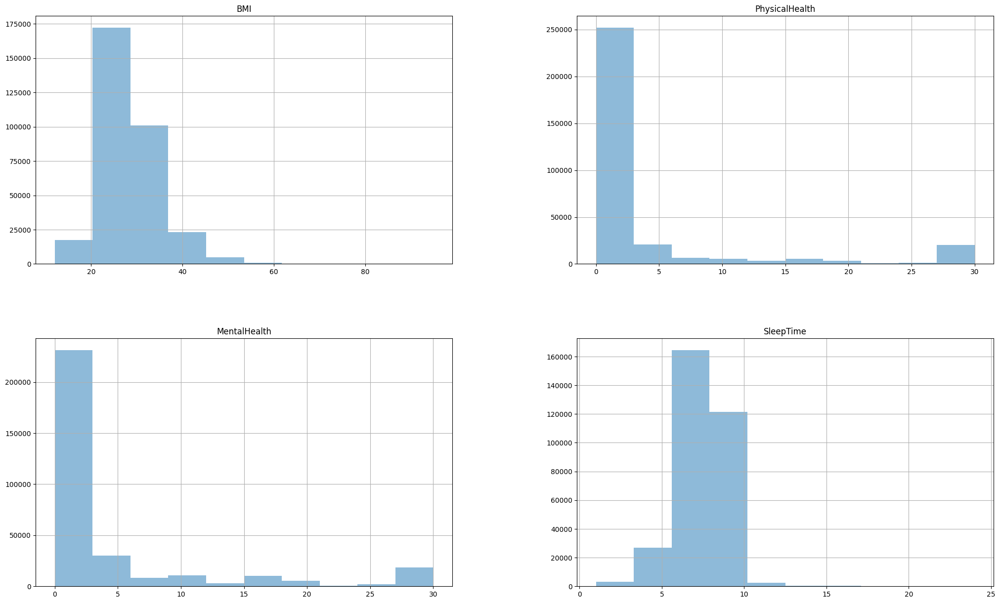

In [ ]:
df.hist(alpha=0.5, figsize=(25,15))

**Correlación con las variables numericas:**

<ipython-input-13-5aab735ed25d>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(df.corr(), annot=True, cmap='YlGnBu', vmin=-1, vmax=1, center=0, ax=ax)


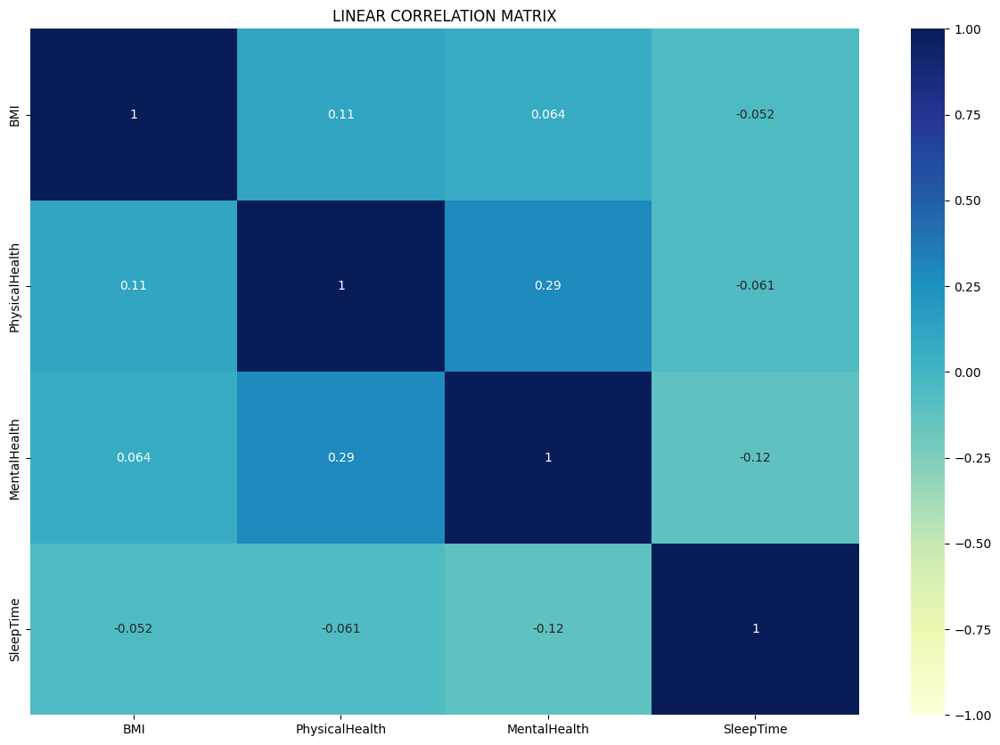

In [ ]:
fig, ax = plt.subplots(figsize=(15,10))
sns.heatmap(df.corr(), annot=True, cmap='YlGnBu', vmin=-1, vmax=1, center=0, ax=ax)
plt.title('LINEAR CORRELATION MATRIX')
plt.show()

En una primera impresión vemos que las variables numericas que parecen ser tener más correlación con la variable objetivo "Heart Disease" son Stroke, DiffWalking, Diabetic, Physical Health, KidneyDisease, Smoking y PhysicalActivity. Faltan comparar con las variables categoricas como Sex, Race y Age las cuales desarrollaremos luego.

## 3. **Analisis Particular de las Variables**

### BMI

Esta es una variable númerica que indica el estado nutricional de la persona considerando dos factores elementales: Su peso actual y su altura. Para personas mayores a 20 años, encontramos que su valor tiene los siguientes significados:


*   Por debajo de 18.5 = Bajo peso
*   18.5 – 24.9 = Normal
*   25.0 – 29.9 = Sobrepeso
*   30.0 o más = Obesidad

Estudios como el Framingham y el Build and Blood Pressure Study han demostrado que la obesidad es un factor de riesgo independiente para padecer enfermedad cardiovascular, y que la distribución regional de la grasa tiene una gran importancia en cuanto a las muertes de origen cardíaco.


**Análisis:** Partiendo de el histograma y el boxplot realizados y los datos extraidos, pudimos observar que el 75% de los datos se encuentran al rededor de la media la cual tiene un valor de 28.325399. En el histograma vemos como los datos en su mayoría tienden hacia la media, sin embargo hay una dispersión relevante explicada por el valor mínimo en los datos de 12.020000 y el máximo de 94.850000 lo cual se traduce en un amplio rango, cabe recalcar que hacia los extremos del histograma la frecuencia de dichos valores no es importante. En el boxplot encontramos que existen varios valores atipicos que son de importancia pues nos dan información sobre los individuos que se alejan de un estado físico adecuado pues su IBM se aleja de un valor normal, de hecho en su mayoría padecen de obecidad lo que los hace más suceptibles a padecer de enfermedades cardiacas. Ahora bien, partiendo del diagrma de barras apiladas que explica la relación de la clase *HeartDisease* con la variable *BMI*, observamos que no hay una tendencia clara sobre los valores de BMI y el padecer o no de una enfermedad cardiaca pues se hace evidente que independientemente de que sea un valor alto o bajo o cercano a la media para el BMI, los porcentajes de padecimiento de enfermedad cardiaca varian semejantemente en los diferentes puntos.

---
*Acerca del índice de masa corporal para adultos. (2022, 29 agosto). Centers for Disease Control and Prevention. https://www.cdc.gov/healthyweight/spanish/assessing/bmi/adult_bmi/index.html*

*(1999, 1 octubre). La obesidad como factor de riesgo cardiovascular | Endocrinología y Nutrición. https://www.elsevier.es/es-revista-endocrinologia-nutricion-12-articulo-la-obesidad-como-factor-riesgo-8620*

In [ ]:
df[["BMI"]].describe()

,BMI
count,319795.000000
mean,28.325399
std,6.356100
min,12.020000
25%,24.030000
50%,27.340000
75%,31.420000
max,94.850000


In [ ]:
df[["BMI"]].value_counts()

BMI  
26.63    3762
27.46    2767
27.44    2723
24.41    2696
27.12    2525
         ... 
25.95       1
53.12       1
25.57       1
25.17       1
94.85       1
Length: 3604, dtype: int64

(array([1.72840e+04, 1.72106e+05, 1.00863e+05, 2.33270e+04, 4.88800e+03,
        9.37000e+02, 2.61000e+02, 8.70000e+01, 2.90000e+01, 1.30000e+01]),
 array([12.02 , 20.303, 28.586, 36.869, 45.152, 53.435, 61.718, 70.001,
        78.284, 86.567, 94.85 ]),
 <BarContainer object of 10 artists>)

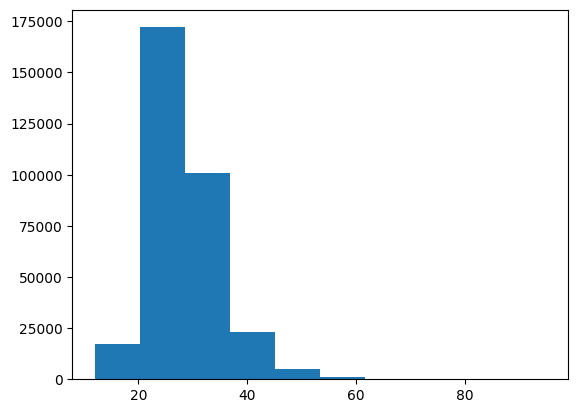

In [ ]:
plt.hist(df[["BMI"]])

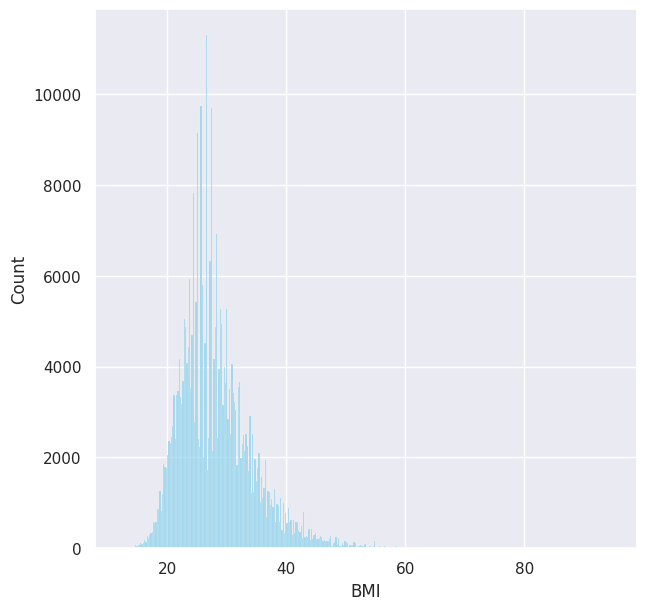

In [ ]:
sns.set(style="darkgrid")

fig, axs = plt.subplots(1, 1, figsize=(7, 7))

sns.histplot(data=df, x="BMI", color="skyblue");

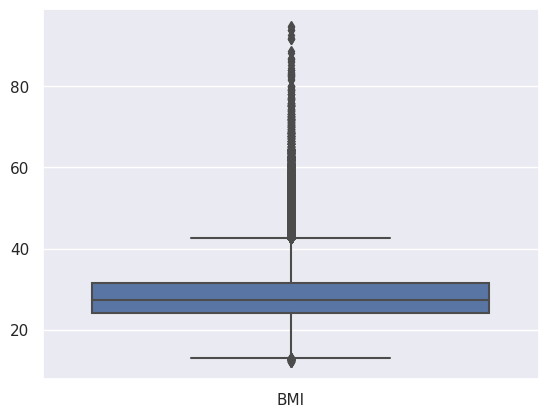

In [ ]:
sns.boxplot(data= df[["BMI"]]);


> Description for  BMI 

count    319795.000000
mean         28.325399
std           6.356100
min          12.020000
25%          24.030000
50%          27.340000
75%          31.420000
max          94.850000
Name: BMI, dtype: float64

> Histogram: 




> Boxplot: 




> BMI VS. HeartDisease 




> BMI VS. HeartDisease - Histograma x Pos= RED / Neg = GREEN 



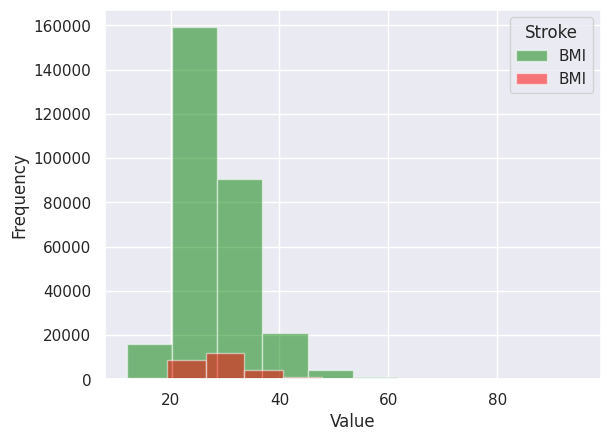

In [ ]:
analyze_numerical(df, "BMI", "HeartDisease")

### Smoking

Esta es una variable binaria categórica que indica si el individuo fuma o no pues este es un factor de riesgo relevante en los temas de aflicciones cardiacas. Los posibles valores son de "Si" o "No".

Actualmente, el tabaco se sitúa entre los factores de riesgo 
independientes más reflejados en las guías de actuación 
de diversas sociedades cardiológicas internacionales para 
la valoración del riesgo cardiovascular: consumo de cigarrillos, hipertensión arterial, colesterol total y LDL (low density lipoproteins o colesterol malo) elevados, colesterol 
HDL (high-density lipoproteins o colesterol bueno) disminuido, diabetes mellitus, obesidad, sedentarismo y edad 
avanzada.
El efecto negativo del tabaco está directamente 
relacionado con la cantidad de cigarrillos fumados en un 
día y la antigüedad del hábito fumador. Además, el riesgo 
es aún mayor cuando la edad de comienzo del hábito es 
anterior a los 15 años.

**Análisis:** Partiendo de el diagrama de pie y barras realizados, se observa que a pesar de que la mayoría de los individuos no fuman, sin embargo, el porcentaje de los que fuman es relevante pues representa el 41,2% de los datos. Gracias al diagrama de barras apiladas, podemos observar la relación entre la clase *HeartDisease* y la variable *Smoking* pues se hace claro que para las personas que si fuman el porcentaje de individuos que padecen de una enfermedad cardiaca se duplica con respecto a las que no fuman, lo cual indica que las personas que si fuman tienden a ser más suceptibles a padecer de dichas enfermedades. No obstante, es importante resaltar que los porcentajes de padecimiento de enfermedades cardiacas para los que no fuman es del 6,03% y el de los que fuman del 12,16%, siendo valores no muy altos y por ende no altamente determinantes. Posiblemente se podría describir mejor la relación entre el tabaquismo y las enfermedades cardiovasculares si se contara con mayor información sobre la cantidad de cigarrillos fumados en un día y la antigüedad del hábito fumador pues, como se mencionó previamente. 

---
(2009). Libro de la salud cardiovascular del Hospital Clínico San Carlos y la Fundación BBVA (1.a ed., Vol. 1). Fundación BBVA. https://www.fbbva.es/publicaciones/libro-de-la-salud-cardiovascular-del-hospital-clinico-san-carlos-y-la-fundacion-bbva/

In [ ]:
df[["Smoking"]].describe()

,Smoking
count,319795
unique,2
top,No
freq,187887


In [ ]:
df[["Smoking"]].value_counts()

Smoking
No         187887
Yes        131908
dtype: int64

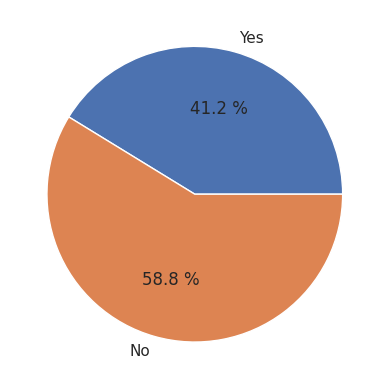

In [ ]:
label = ["Yes", "No"]
value = [131908,187887]
plt.pie(value, labels=label, autopct="%0.1f %%")
plt.show()

(array([131908.,      0.,      0.,      0.,      0.,      0.,      0.,
             0.,      0., 187887.]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 <BarContainer object of 10 artists>)

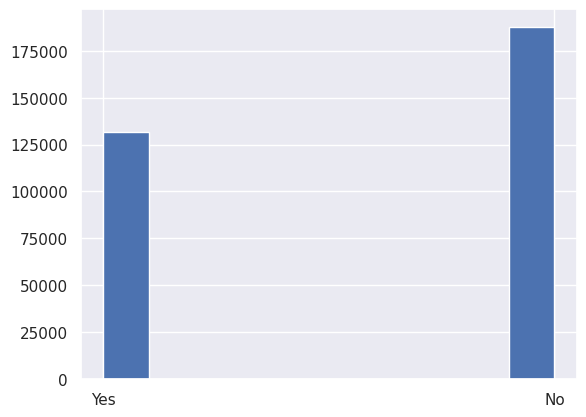

In [ ]:
plt.hist(df[["Smoking"]])

In [ ]:
stacked_bar_chart_with_percentages(df,"Smoking","HeartDisease")

<ipython-input-6-0448416eaef0>:8: FutureWarning:

Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)



### Alcohol Drinking

Esta es una variable binaria categórica que indica si el individuo bebe o no alcohol de forma habitual pues este es un factor de riesgo relevante en los temas de afecciones cardiacas. Los posibles valores son de "Si" o "No". 

Según expertos, el consumo moderado de alcohol puede reducir el riesgo de enfermedad coronaria tanto en hombres como en mujeres. No sólo reduce el riesgo de sufrir la enfermedad coronaria, sino también la 
mortalidad por esas enfermedades. 
No obstante, existe una clara asociación demostrada entre el consumo 
excesivo de alcohol y la aparición de tensión arterial elevada (hipertensión arterial). Incluso en algunos estudios 
epidemiológicos se ha estimado que más de un 10% de los 
varones presenta hipertensión por un consumo elevado 
de alcohol.

**Análisis:** Partiendo de el diagrama de pie y barras realizados, es claro que en su mayoría los individuos no consumen alcohol frecuentemente, de hecho, el 93,2% de estos no lo hacen. Ahora, partiendo del diagrama de barras apiladas que relaciona la clase *HeartDisease* y la variable *AlcoholDrinking*, podemos ver como hay una mayor cantidad de individuos que padecen de afecciones cardiacas cuando no se bebe alcohol de forma habitual que cuando si se bebe, sin embargo la diferencia porcentual es de 3,56% lo cual no es mucho por lo cual no es muy relevante, de hecho, teniendo en cuenta el volumen de individuos que no beben con respecto a los que si esta diferencia porcentual es aún más discriminable razón por la cual se podría decir que la variable *AlcoholDrinking* no influye directamente sobre la clase. 

---
(2009). Libro de la salud cardiovascular del Hospital Clínico San Carlos y la Fundación BBVA (1.a ed., Vol. 1). Fundación BBVA. https://www.fbbva.es/publicaciones/libro-de-la-salud-cardiovascular-del-hospital-clinico-san-carlos-y-la-fundacion-bbva/

In [ ]:
df[["AlcoholDrinking"]].describe()

,AlcoholDrinking
count,319795
unique,2
top,No
freq,298018


In [ ]:
df[["AlcoholDrinking"]].value_counts()

AlcoholDrinking
No                 298018
Yes                 21777
dtype: int64

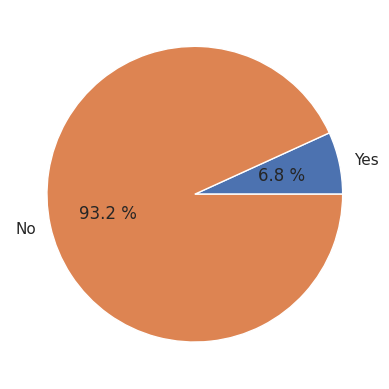

In [ ]:
label = ["Yes", "No"]
value = [21777,298018]
plt.pie(value, labels=label, autopct="%0.1f %%")
plt.show()

(array([298018.,      0.,      0.,      0.,      0.,      0.,      0.,
             0.,      0.,  21777.]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 <BarContainer object of 10 artists>)

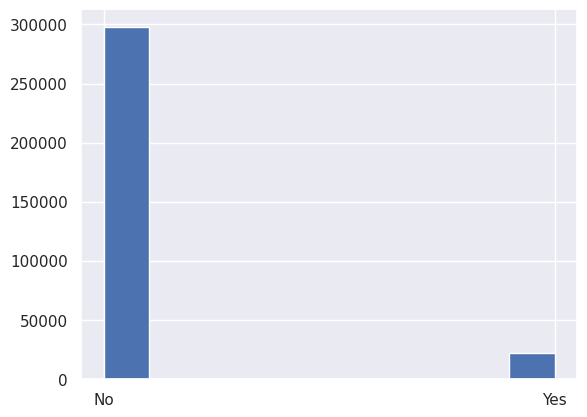

In [ ]:
plt.hist(df[["AlcoholDrinking"]])

In [ ]:
stacked_bar_chart_with_percentages(df,"AlcoholDrinking","HeartDisease")

<ipython-input-6-0448416eaef0>:8: FutureWarning:

Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)



### Stroke

Esta es una variable binaria categórica que indica si el individuo ha tenido un ataque cardiaco previamente. Los posibles valores son de "Si" o "No". 

Las consecuencias de un infarto al miocardio siempre dependerán de lo extenso que haya sido. Si el infarto agudo de miocardio es leve, de poca extensión, el paciente tiene altas probabilidades de recuperarse y llevar una vida normal, aunque deberá controlar los factores de riesgo para impedir la ocurrencia de un nuevo infarto. la secuela más temida de un infarto al miocardio es la insuficiencia cardiaca, es decir, el paciente queda con un daño permanente en el corazón. Debemos recordar que el corazón es una bomba, y tras un infarto muy extenso, pierde la capacidad de contracción, lo que determina que ese paciente pueda requerir de un monitoreo permanente, tanto con fármacos, como con ejercicios y cambios en su alimentación.

**Análisis:** Partiendo de el gráfico de barras y pie realizados, se observa que en su mayoría los individuos no han tenido un infarto previamente, en total el 96,2%. Esta es una variable que instintivamente tenderiamos a asociar a la clase, sin embargo, factores más específicos como la duración del infarto son de bastante importancia y, de igual forma, si las personas que tuvieron el infarto contiuaron con los mismos habitos que llevaban. Ahora bien, gracias al diagrama de barras apiladas que relaciona a la clase *HeartDisease* con la variable *Stroke*, podemos ver claramente que el haber tenido un ataque cardiaco esta directamente relacionado con el padecer de una enfermedad cardiaca pues el 36,37% de las personas que han padecido de un ataque cardiaco cuentan con un problema de corazón, siendo este porcentaje mucho mayor comparado con el 7,47% de las personas que no han padecido de un ataque cardiaco, por ende, se podría decir que la variable *Stroke* es de alto valor a la hora de describir a la clase. 

---
D. (2021, 24 junio). Causas, síntomas y secuelas de un infarto al corazón. Clínica Dávila. https://www.davila.cl/causas-sintomas-y-secuelas-de-un-infarto-al-corazon/

In [ ]:
df[["Stroke"]].describe()

,Stroke
count,319795
unique,2
top,No
freq,307726


In [ ]:
df[["Stroke"]].value_counts()

Stroke
No        307726
Yes        12069
dtype: int64

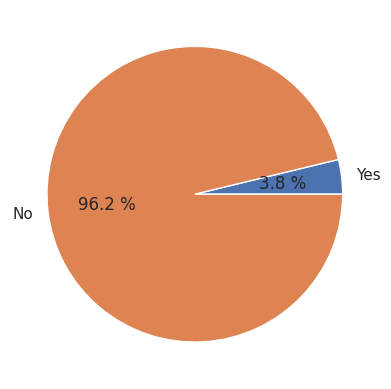

In [ ]:
label = ["Yes", "No"]
value = [12069,307726]
plt.pie(value, labels=label, autopct="%0.1f %%")
plt.show()

(array([307726.,      0.,      0.,      0.,      0.,      0.,      0.,
             0.,      0.,  12069.]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 <BarContainer object of 10 artists>)

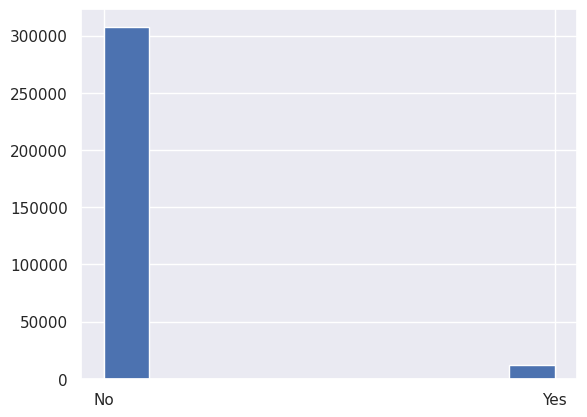

In [ ]:
plt.hist(df[["Stroke"]])

In [ ]:
stacked_bar_chart_with_percentages(df,"Stroke","HeartDisease")

<ipython-input-6-0448416eaef0>:8: FutureWarning:

Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)



### PhysicalHealth

Esta es una variable discreta que indica los días del mes que ha estado enfermo. Los posibles valores están en rango entre 0 y 30.

Esta variable es importante pues ayudará a entender si hay alguna relación entre el estado de salud del individuo con la posibilidad de que esté sea más o menos propenso a tener un paro cardiaco. De no encontrar una relacción directa, se estaría hablando de un ataque cardiaco silencioso o súbito, en cuyo caso el individuo solo se daría cuenta en pleno ataque.

**Análisis:** Gracias a los gráficos se puede saber que la gran mayoría de los individuos suelen llevar una vida aparentemente saludable, pues más del 50% no pasa un solo día enfermo durante el mes. Por otro lado, si hay un grupo representativo que presenta malestar durante los 30 dias del mes. Partiendo del diagrama de barras apiladas que relaciona la variable *PhysicalHealth* con la clase *HeartDisease*, podemos observar como a medida que aumenta la cantidad de días de enfermedad tiende a aumentar el porcentaje de individuos que padecen de una enfermedad cardiaca por lo cual se concluye que la variable describe directamente a la clase pues estan relacionadas. 
 

---
Paro cardíaco súbito. The Texas Heart Institute. https://www.texasheart.org/heart-health/heart-information-center/topics/paro-cardiaco-subito/

In [ ]:
df[["PhysicalHealth"]].describe()

,PhysicalHealth
count,319795.00000
mean,3.37171
std,7.95085
min,0.00000
25%,0.00000
50%,0.00000
75%,2.00000
max,30.00000


In [ ]:
df[["PhysicalHealth"]].value_counts()

PhysicalHealth
0.0               226589
30.0               19509
2.0                14880
1.0                10489
3.0                 8617
5.0                 7606
10.0                5453
15.0                5012
7.0                 4629
4.0                 4468
20.0                3216
14.0                2893
6.0                 1270
25.0                1164
8.0                  924
21.0                 626
12.0                 605
28.0                 446
29.0                 204
9.0                  180
18.0                 167
16.0                 135
27.0                 124
17.0                 110
13.0                  91
22.0                  89
11.0                  85
24.0                  67
26.0                  66
23.0                  46
19.0                  35
dtype: int64

(array([251958.,  20691.,   6823.,   5718.,   3589.,   5257.,   3418.,
           761.,   1297.,  20283.]),
 array([ 0.,  3.,  6.,  9., 12., 15., 18., 21., 24., 27., 30.]),
 <BarContainer object of 10 artists>)

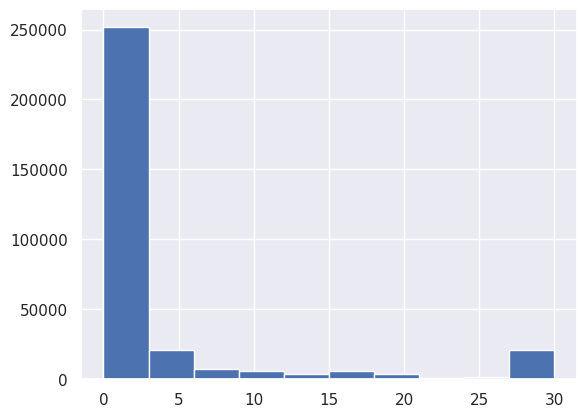

In [ ]:
plt.hist(df[["PhysicalHealth"]])

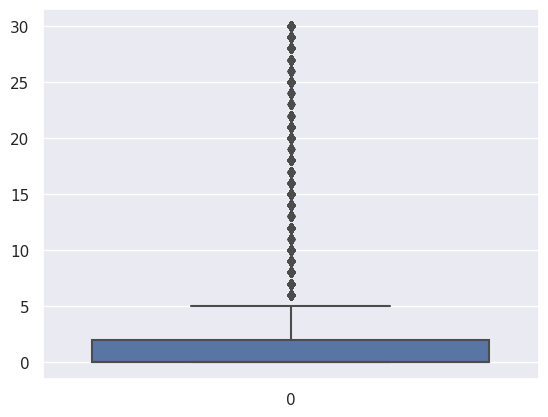

In [ ]:
sns.boxplot(data=df["PhysicalHealth"]);

In [ ]:
stacked_bar_chart_with_percentages(df,"PhysicalHealth","HeartDisease")

<ipython-input-6-0448416eaef0>:8: FutureWarning:

Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)



### MentalHealth


Esta es una variable discreta que indica cuantos días del mes el individuo no se ha sentido bien mentalmente. Los valores de la variable puede estar en un rango entre 1 y 30 días.

Esta variable es muy importante pues permitirá encontrar si existe alguna relación entre el estado de salud mental del individuo y la posibilidad de que sufra un paro cardiaco. Es importante considerar que hoy en día se sabe que a mayor nivel de estrés y/o ansiedad, peor el estado físico, lo cual podría evidenciarse en un paro cardiaco. 

**Análisis:** Gracias a las gráficas se puede saber que la gran mayoría de los individuos no suelen presentar un estado mental con complicaciones, pues más del 50% no presenta un solo día con complicaciones mentales durante el mes. Sin embargo, si se puede observar un porcentaje pequeño que sí presenta un mal estado de salud mental, ya sea durante 5, 10, 15 y 30 días (siendo estos los percentiles más altos). Gracias al diagrama de barras apiladas que relaciona a la clase *HeartDisease* y a la variable *MentalHealth*, vemos que hay una amplia variabilidad entre los porcentajes de padecimiento de una enfermedad cardiaca a lo largo de los días con un mal estado mental, no hay una tendencia clara por lo cual se podría decir que esta variable no esta directamente relacionada con el comportamiento de la clase. 

---
El estrés emocional eleva el riesgo de infarto sin tener problemas coronarios. (2017, 29 julio). El Vanguardista. https://www.lavanguardia.com/vida/salud/20170829/43894434621/congreso-cardiologia-estres-emocional-aumenta-riesgo-infarto.html

El estrés prolongado puede causar ataques cardíacos. (2021, 5 agosto). Salud Bienestar. https://www.diariodesevilla.es/salud/investigacion-tecnologia/estres-prolongado-ataques-cardiacos-salud-mental_0_1598840623.html

In [ ]:
df[["MentalHealth"]].describe()

,MentalHealth
count,319795.000000
mean,3.898366
std,7.955235
min,0.000000
25%,0.000000
50%,0.000000
75%,3.000000
max,30.000000


(array([231187.,  29994.,   8132.,  10799.,   2915.,  10176.,   5663.,
           518.,   2080.,  18331.]),
 array([ 0.,  3.,  6.,  9., 12., 15., 18., 21., 24., 27., 30.]),
 <BarContainer object of 10 artists>)

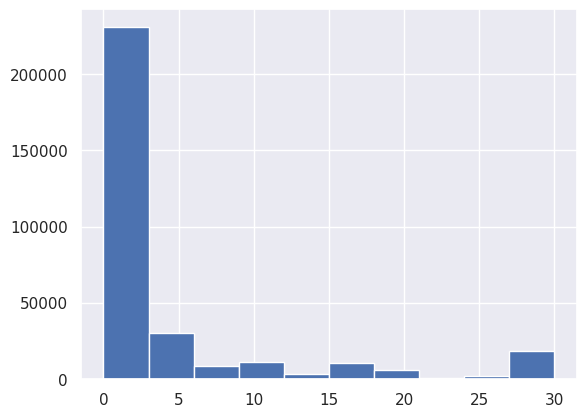

In [ ]:
plt.hist(df[["MentalHealth"]])

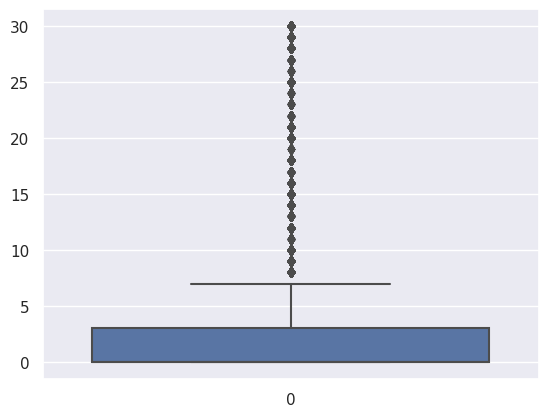

In [ ]:
sns.boxplot(data=df["MentalHealth"]);

In [ ]:
stacked_bar_chart_with_percentages(df,"MentalHealth","HeartDisease")

<ipython-input-6-0448416eaef0>:8: FutureWarning:

Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)



### DiffWalking

Esta es una variable categórica que indica si el individuo ha tenido problemas para caminar o subir escaleras. Los posibles valores son "Si" y "No".

Esta variable es muy importante pues el dolor en la parte inferior del cuerpo puede deberse a lesiones, artritis o estar en mala forma, pero también podría indicar problemas de circulación en las piernas causados por una enfermedad arterial periférica. “Al igual que las obstrucciones en las arterias coronarias pueden causar ataques cardíacos, las obstrucciones en las arterias de las piernas pueden causar dolor al caminar”. (Dr. Deepak L. Bhatt, director de Mount Sinai Heart)

**Análisis:** Gracias a las gráficas se puede saber que la gran mayoría de los individuos no suelen presentar dificultad para caminar o subir las escaleras; de esta forma, se podría descartar este síntoma y analizar el resto. Sin embargo, es importante resaltar que como se observa el el diagrama de barras apiladas que relaciona la clase *HeartDisease* y la variable *DiffWalking*, hay un amplio porcentaje de individuos que padecen de enfermedades cardiacas dentro de los que si han tenido dificultades para caminar, en específico el 22,58%, el cual es un porcentaje que se encuentra muy por encima del 6,3% de los individuos que adecen de enfermedades cardiacas dentro de los que no han tenido dificultades para caminar, por lo cual podríamos concluir que si existe una relación entre los problemas al caminar y problemas cardiacos. 

---
10 señales sigilosas de que podrías tener una enfermedad del corazón. (2023, 27 enero). EAARP. https://www.aarp.org/espanol/salud/enfermedades-y-tratamientos/info-2022/sintomas-enfermedades-del-corazon.html

In [ ]:
df[["DiffWalking"]].describe()

,DiffWalking
count,319795
unique,2
top,No
freq,275385


In [ ]:
df[["DiffWalking"]].value_counts()

DiffWalking
No             275385
Yes             44410
dtype: int64

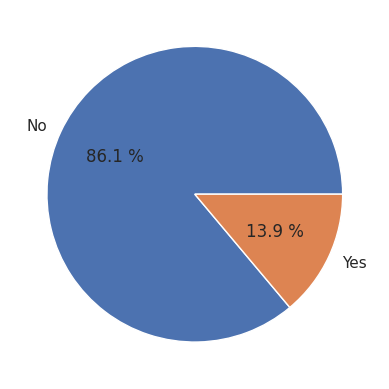

In [ ]:
label = ["No", "Yes"]
value = [275385,44410]
plt.pie(value, labels=label, autopct="%0.1f %%")
plt.show()

(array([275385.,      0.,      0.,      0.,      0.,      0.,      0.,
             0.,      0.,  44410.]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 <BarContainer object of 10 artists>)

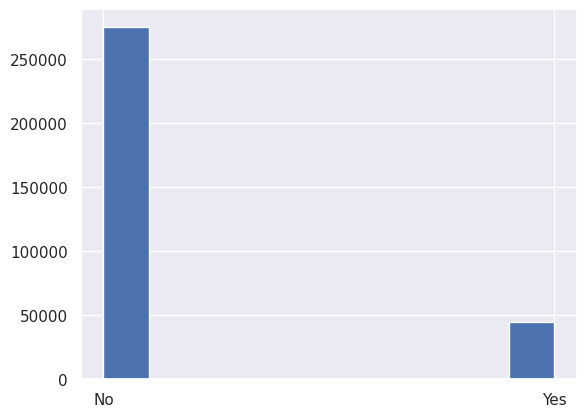

In [ ]:
plt.hist(df[["DiffWalking"]])

In [ ]:
stacked_bar_chart_with_percentages(df,"DiffWalking","HeartDisease")

<ipython-input-6-0448416eaef0>:8: FutureWarning:

Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)



### Sex

Esta es una variable categórica que indica si el sexo del individuo. Los posibles valores son "Female" y "Male".

Esta variable es muy importante pues permitirá analizar alguna posible relación entre el riesgo de padecer un ataque cardiaco y el sexo del invidividuo. Según el último informe nacional de 2022, la mortalidad asociada a cardiopatía isquémica afecta al doble de mujeres que hombres (La Vanguardia), por lo cual es muy importante poder detectar un patrón que pueda diferenciar síntomas para así poder detectar a tiempo algún indicador de posible ataque cardiaco a futuro.

**Análisis:** Gracias a las gráficas se puede saber que la gran mayoría de los individuos analizadas son mujeres aunque la diferencia es de solo un 5%. Ahora, partiendo del diagrama de barras apiladas que relaciona a la clase *HeartDisease* con la variable *Sex*, podemos observar como son más los hombres que padecen de una enfermedad cardiaca con el 10,62% sobre el total que el 6,69% de las mujeres que sufren de este tipo de enfermedades, cabe recalcar que la diferencia porcentual es de 3,93% lo cual es muy poco para establecer que existe una clara relación entre el sexo y las afecciones cardiacas, por ende,concluimos que no hay una relación directa entre la descripción de la clase y esta variable.

---
Los hombres sufren más infartos, aunque suelen ser más graves en mujeres. (2022, 29 septiembre). La Vanguardia. https://www.lavanguardia.com/ciencia/20220929/8547629/ataques-corazon-son-mas-comunes-hombres-mas-graves-mujeres.html#:~:text=%22Seg%C3%BAn%20la%20serie%20de%20pacientes,emergencias%20card%C3%ADacas%20en%20la%20mujer

In [ ]:
df[["Sex"]].describe()

,Sex
count,319795
unique,2
top,Female
freq,167805


In [ ]:
df[["Sex"]].value_counts()

Sex   
Female    167805
Male      151990
dtype: int64

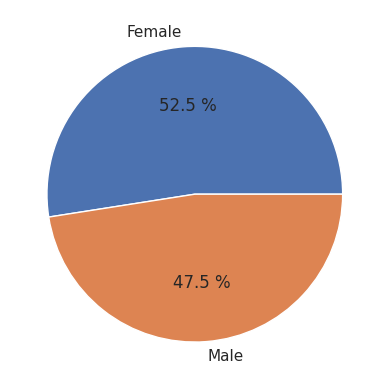

In [ ]:
label = ["Female", "Male"]
value = [167805,151990]
plt.pie(value, labels=label, autopct="%0.1f %%")
plt.show()

(array([167805.,      0.,      0.,      0.,      0.,      0.,      0.,
             0.,      0., 151990.]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 <BarContainer object of 10 artists>)

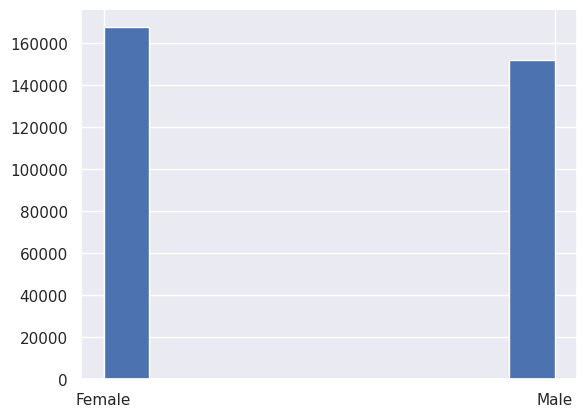

In [ ]:
plt.hist(df[["Sex"]])

In [ ]:
stacked_bar_chart_with_percentages(df,"Sex","HeartDisease")

<ipython-input-6-0448416eaef0>:8: FutureWarning:

Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)



### AgeCategory

Esta variable, tambien categorica, agrupa a las personas del dataset en distintos rangos etareos. Analizaremos si existe alguna relacion entre estas categorias y la variable a predecir, enfermdad del corazon.

In [ ]:
analyze_categorical(df, "AgeCategory", "HeartDisease")


> Description for  AgeCategory 

count     319795
unique        13
top        65-69
freq       34151
Name: AgeCategory, dtype: object

> Bar Chart - Absolute values: 




> Pie Chart - Relative %: 




> AgeCategory VS. HeartDisease 



<ipython-input-6-0448416eaef0>:8: FutureWarning:

Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)



1) Vemos que la distribucion de nuestros datos es bastante representativa de las sociedades de paises desarrolados actuales, donde lo comun es observar una piramide poblacional con mayor cantidad de personas entre 30 y 60 años y menor cantidad:

In [ ]:
av = df["AgeCategory"]
counts = av.value_counts()
counts = counts.sort_index()

fig = px.bar(x=counts.index, y=counts.values)
fig.update_layout(yaxis_title='Count')
fig.update_layout(xaxis_title="AgeCategory")
fig.update_traces(texttemplate='%{y}', textposition='inside')
fig.show()

> Vemos una poblacion "envejecida", donde hay una gran cantidad de gente entre 50 y 74 años y una menor cantidad de gente joven. Algunos ejemplos de piramides poblacionales: 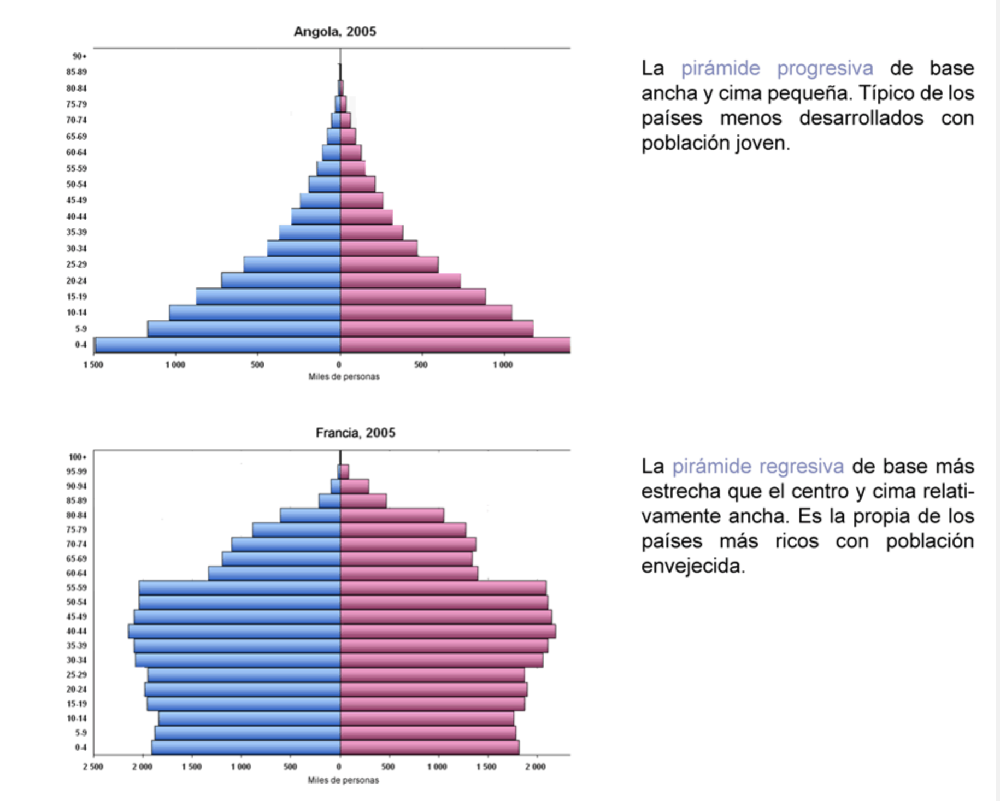

> Esta informacion puede ser util para conocer mas sobre la muestra sobre la cual estamos trabajando, aunque ya sabemos que se trata de datos obtenidos de Estados Unidos, si no lo supieramos podriamos inferir que se trata de datos obetenidos en un pais desarrollado, lo cual a futuro tambien podria brindarnos mayor informacion sobre los habitos de las personas. 

2) Lo segundo que notamos, y no por eso menos importante, es que se verifica la esperada relacion de Edad-Riesgo de enfermedad cardiaca. Como era de esperarse, vemos que existe una tendencia a que el riesgo aumente a medida que las personas van envejeciendo. Esto normalmente es de publico conocimiento y puede deberse a diversos factores medicos relacionados con la vejez. Seria interesante estudiar a futuro como impactan otras variables en rangos de edad altos [como por ejemplo el tabaquismo, el alcoholismo, o la actividad fisica] para ver como pueden mitigarse, o evitarse perjuicios mayores, de la edad sobre la salud. 

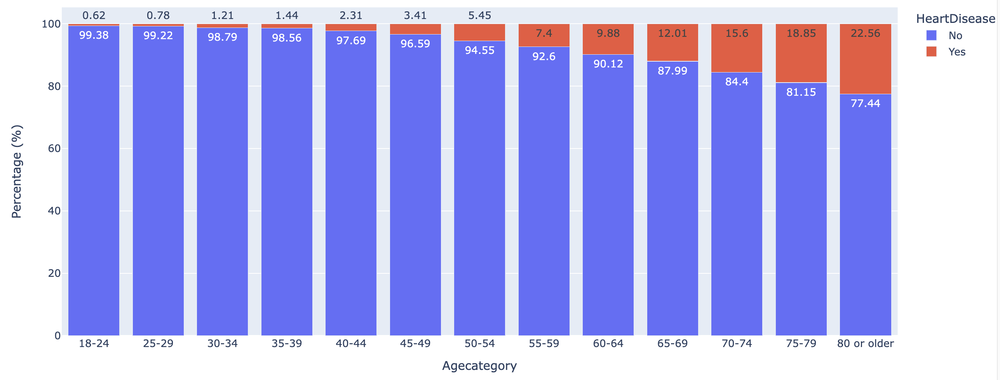

3. Discriminar entre categorias de edad le permitira a nuestro modelo predecir con mayor exactitud el riesgo de enfermedad del corazon.

### Race

Esta variable muestra la etnicidad de las personas que conforman nuestro dataset. Los valores que esta puede tomar son:

 - White
 - Black
 - Asian
 - American Indian/Alaskan Native
 - Other
 
 Veremos como se conforma nuestra muestra y tambien estudiaremos si existe alguna relacion entre alguna de estas categorias y la variable objetivo. En caso de que exista alguna relacion, seria pertinente realizar un estudio mas profundo que nos permita entender si existe alguna tradicion / comportamiento de la clase en cuestion que podria llegar a correlacionarse con un la probabilidad de Heart Disease.

In [ ]:
analyze_categorical(df, "Race", "HeartDisease")


> Description for  Race 

count     319795
unique         6
top        White
freq      245212
Name: Race, dtype: object

> Bar Chart - Absolute values: 




> Pie Chart - Relative %: 




> Race VS. HeartDisease 



<ipython-input-6-0448416eaef0>:8: FutureWarning:

Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)



<ipython-input-57-411bd3d6cab3>:2: FutureWarning:

Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)



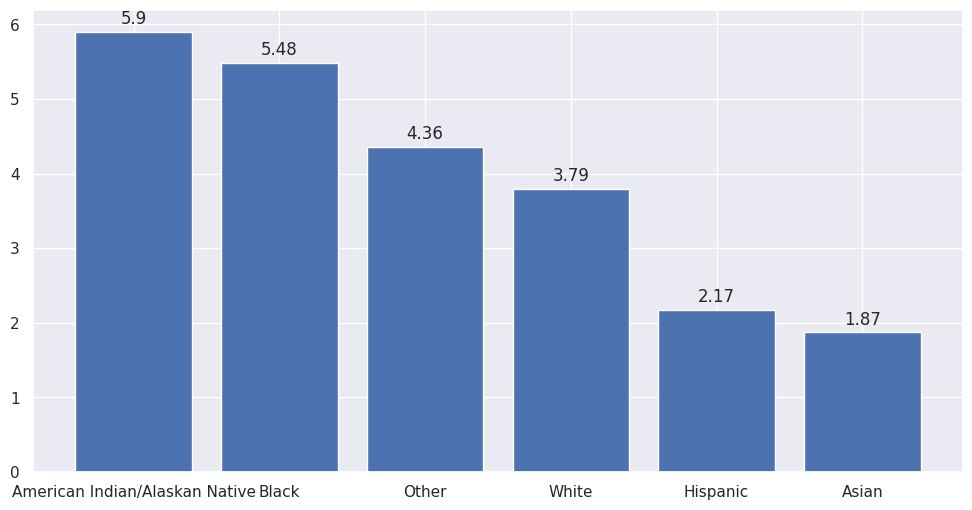

In [ ]:
grouped_data = df.groupby(["Race", "Stroke"]).size().reset_index(name='counts')
grouped_data['percentage'] = grouped_data.groupby("Race")['counts'].apply(lambda x: round(100 * x / x.sum(),2))
grouped_data = grouped_data[grouped_data["Stroke"]=="Yes"]
grouped_data = grouped_data.sort_values(by="percentage", ascending = False)
                         
valores = grouped_data["percentage"]
labels = grouped_data["Race"]

fig, ax = plt.subplots(figsize=(12, 6))
bars = ax.bar(labels, valores)

for bar in bars:
    height = bar.get_height()
    ax.annotate(f'{height}', xy=(bar.get_x() + bar.get_width() / 2, height),
                xytext=(0, 3), textcoords='offset points', ha='center', va='bottom')


**Sobre Race**

1) Vemos que nuestro dataset se compone en su mayoria por personas que caen dentro de la categoria "White", con un 76,7% de los casos, donde el siguiente en proporcion ("hispanic") tiene apenas un 8,58% de los casos. Esto nos brinda informacion, tambien, de como se compone la poblacion que estamos estudiando en este dataset. 

2) Vemos [Grafico de abajo] que las categorias de Race = "American Indian" y Race = "Black" son las que mayores cantidades de enfermedades cardiacas tienen en terminos porcentuales, mientras que Race = "Asian" presume la cantidad mas baja. Seria interesante entender cuales son los motivos de que esto suceda, existen diferencias de tradiciones, oportunidades, acceso a salud o eduacion, etc entre estas personas en la sociedad estudiada?

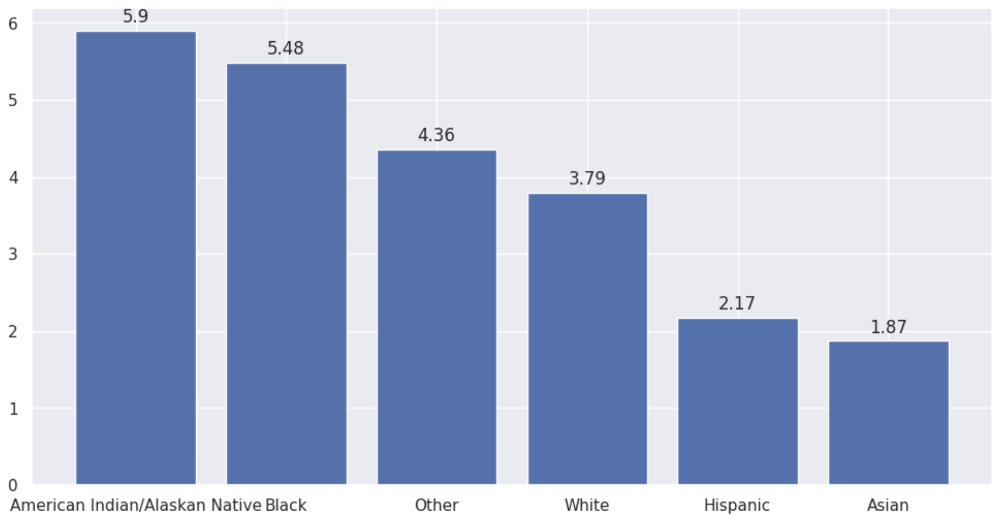

3) Los datos sugieren que la Raza podria ser un factor que agregue capacidad predictiva sobre el riesgo de enfermedad cardiaca cardiaco en esta poblacion. 

### Diabetic

Esta categoria nos indica si una persona tiene o no diabetes cronica, si tuvo durante el embarazo y tambien si es "borderline" diabetes. Los valores que toma la variable son:
    
- Yes
- No 
- No, borderline diabetes
- Yes (during pregnancy)

A priori, esperariamos ver que este campo tiene algun tipo de relacion con el riesgo de HeartDisease. Vamos a estudiarlo:

In [ ]:
analyze_categorical(df, "Diabetic", "HeartDisease")


> Description for  Diabetic 

count     319795
unique         4
top           No
freq      269653
Name: Diabetic, dtype: object

> Bar Chart - Absolute values: 




> Pie Chart - Relative %: 




> Diabetic VS. HeartDisease 



<ipython-input-6-0448416eaef0>:8: FutureWarning:

Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)



**Sobre Diabetes**

1) Observamos que la gran mayoria de la gente de la muestra NO tiene diabetes. Tan solo el 13% de la gente SI tiene, y muy pocas personas tuvieron (0.8%) diabetes durante el embarazo. Existe un 4to grupo, con el 2.12% de los casos que NO tiene diabetes diagnosticada pero esta muy cerca de tenerla. 

2) Como era de esperarse, vemos que la gente CON diabetes, tiene la mayor probabilidad de HeartDisease con un porcentaje de positivos muy alto del 22%, seguida por la gente que NO tiene pero esta muy cerca de tenerla a nivel diagnostico (Borderline). Esto sera un buen predictor para nuestros modelos. 

3) Interesante notar que las personas que tuvieron diabetes durante el embarazo son las que menor cantidad de casos positivos presentan, incluso menos que las personas que nunca tuvieron. 

### Physical Activity

Variable binaria que indica si la persona realizo actividad fisica o no. Personas que reportan haber realizado actividad fisica en _los ultimos 30 dias_ o durante su dia a dia en el trabajo.

Estudiaremos si existe relacion (mayor o menor probabilidad) entre los casos positivos de infartos y el hacer o no deporte. 

A priori, comentamos que creemos que esta variable podria medirse mejor, generar categorias que midan el nivel de actividad fisica con una mayor granuralida, ya que con la medicion actual se esta tratando igual a una persona que hace deporte 1 vez por mes que a una persona que entrena 7 veces a la semana y es un atleta de alto rendimiento. Estas diferencias claramente tendrian un impacto sobre la salud cardiaca.

In [ ]:
analyze_categorical(df, "PhysicalActivity", "HeartDisease")


> Description for  PhysicalActivity 

count     319795
unique         2
top          Yes
freq      247957
Name: PhysicalActivity, dtype: object

> Bar Chart - Absolute values: 




> Pie Chart - Relative %: 




> PhysicalActivity VS. HeartDisease 



<ipython-input-6-0448416eaef0>:8: FutureWarning:

Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)



**Sobre Physical Activity:**

1) Vemos que, relacionado con lo que comentabamos previamente, la mayoria de las personas realizo actividad fisica en los ultimos 30 dias _al menos una vez_

2) Si bien esta variable no representa bien el _grado de actividad fisica_ de las personas, lo que SI puede representar bien es a la gente que realiza **_realmente muy poca actividad fisica_** --> el 14% de los que caen en la categoria NO, son casos positivos de HeartDisease, casi 2 veces la cantidad de casos positivos que presentan las personas que SI hacen actividad fisica al menos una vez al mes. Por lo que esta variable tambien nos agrega un buen poder predictor sobre nuestra variable objetivo.

### GenHealth

Gen Health es una variable que representa la percepción del encuestado sobre su propia salud en general, los mismos pueden categorizar su salud en 5 categorias (excellent, very good, good, fair o poor).

<Axes: >

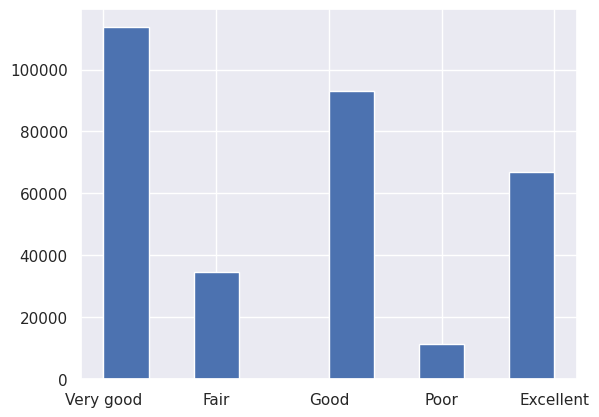

In [ ]:
df['GenHealth'].hist()

           Positives  Negatives  Totals
GenHealth                              
Excellent       1500      65342   66842
Fair            7084      27593   34677
Good            9558      83571   93129
Poor            3850       7439   11289
Very good       5381     108477  113858




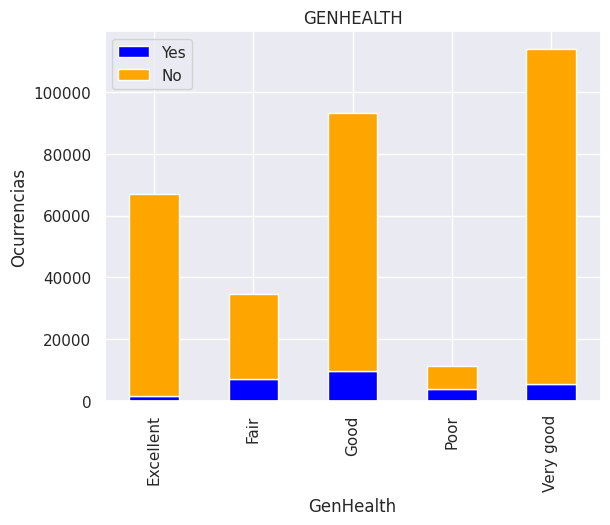

In [ ]:
df['HeartDisease'] = pd.Series(np.where(df.HeartDisease.values == 'Yes', 1, 0),df.index)
barrassup('GenHealth')

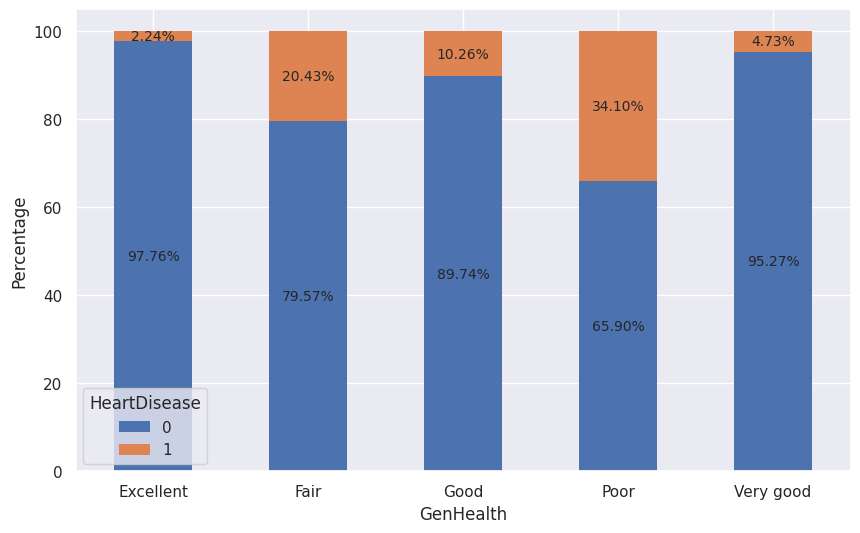

In [ ]:
stacked_bar_plot('GenHealth','HeartDisease')

**Sobre GenHealth**

1) Se observa que alrededor de un 65% de las personas consideran contar con una salud general "Buena" o "Muy Buena" (Good o Very Good).

2) Se observa un claro aumento porcentual de casos que presentan una Heart Diasease a medida que empeora la Gen Health de los encuestados, por lo que se destaca una correlación a tener en cuenta para el modelo.

### SleepTime

SleepTime es una variable que indica en promedio las horas diarias de sueño que duermen los pacientes.

<Axes: >

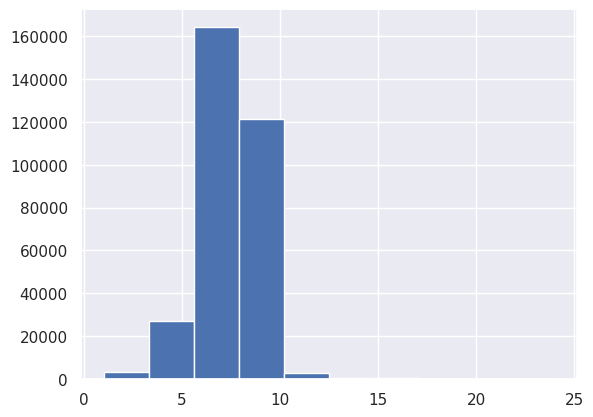

In [ ]:
df['SleepTime'].hist()

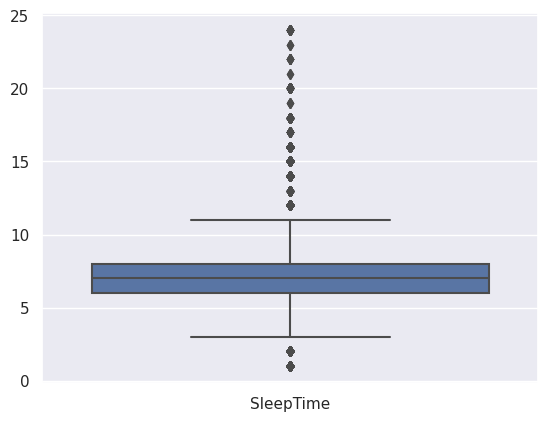

In [ ]:
sns.boxplot(data= df[["SleepTime"]]);

           Positives  Negatives  Totals
SleepTime                              
1.0               60        491     551
2.0              128        660     788
3.0              347       1645    1992
4.0             1180       6570    7750
5.0             2030      17154   19184
6.0             5427      61294   66721
7.0             6325      91426   97751
8.0             8358      89244   97602
9.0             1696      14345   16041
10.0            1165       6631    7796
11.0              73        342     415
12.0             416       1789    2205
13.0              18         79      97
14.0              43        200     243
15.0              24        165     189
16.0              34        202     236
17.0               2         19      21
18.0              21         81     102
19.0               1          2       3
20.0              16         48      64
21.0               0          2       2
22.0               3          6       9
23.0               0          2       3


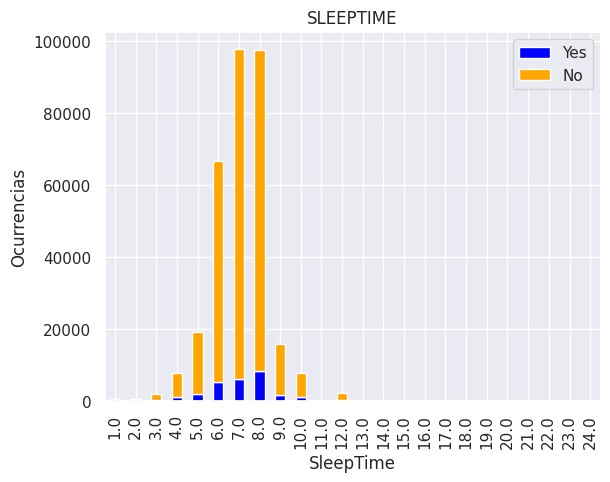

In [ ]:
barrassup('SleepTime')

Analisamos los casos de pacientes que duermen más de 14 horas diarias.

In [ ]:
df[df['SleepTime']>14].describe(include = "all")

,HeartDisease,BMI,Smoking,AlcoholDrinking,Stroke,PhysicalHealth,MentalHealth,DiffWalking,Sex,AgeCategory,Race,Diabetic,PhysicalActivity,GenHealth,SleepTime,Asthma,KidneyDisease,SkinCancer
count,659.000000,659.000000,659,659,659,659.000000,659.000000,659,659,659,659,659,659,659,659.000000,659,659,659
unique,NaN,NaN,2,2,2,NaN,NaN,2,2,13,6,4,2,5,NaN,2,2,2
top,NaN,NaN,Yes,No,No,NaN,NaN,No,Female,80 or older,White,No,No,Good,NaN,No,No,No
freq,NaN,NaN,340,619,578,NaN,NaN,356,376,91,349,449,346,185,NaN,525,580,600
mean,0.162367,30.009454,NaN,NaN,NaN,11.030349,9.383915,NaN,NaN,NaN,NaN,NaN,NaN,NaN,16.949924,NaN,NaN,NaN
std,0.369067,8.342048,NaN,NaN,NaN,12.990960,12.310933,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.311379,NaN,NaN,NaN
min,0.000000,12.530000,NaN,NaN,NaN,0.000000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,15.000000,NaN,NaN,NaN
25%,0.000000,24.210000,NaN,NaN,NaN,0.000000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,15.000000,NaN,NaN,NaN
50%,0.000000,28.700000,NaN,NaN,NaN,3.000000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,16.000000,NaN,NaN,NaN
75%,0.000000,33.875000,NaN,NaN,NaN,30.000000,20.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,18.000000,NaN,NaN,NaN


**Sobre SleepTime**

1) Es interesante observar y remarcar que la distribuciòn (LogNormal) tiene sentido ya que se acumulan las frecuencias en el rango de 6 a 9 horas diarias lo cual tiene sentido logico. 

2) Haciendo un analisis más profundo en los casos poco comunes como los pacientes que duermen mas de 14 horas, no solo ve que se deben a unos pocos casos comparados con la población total si no que se condicen con pacientes de edades elevadas con tendencia al ashtma y a altos niveles de BMI por lo que aun siendo atipicos tienen una justificación y decidimos mantenerlos para la predicción.

### Asthma

Ashtma es una variable categorica que indica si cada encuestado tiene o no asthma, una afección respiratoria que causa que las vias respiratorias se hinchen o se estrechen causando dificultad para respirar.

        Positives  Negatives  Totals
Asthma                              
No          22440     254483  276923
Yes          4933      37939   42872




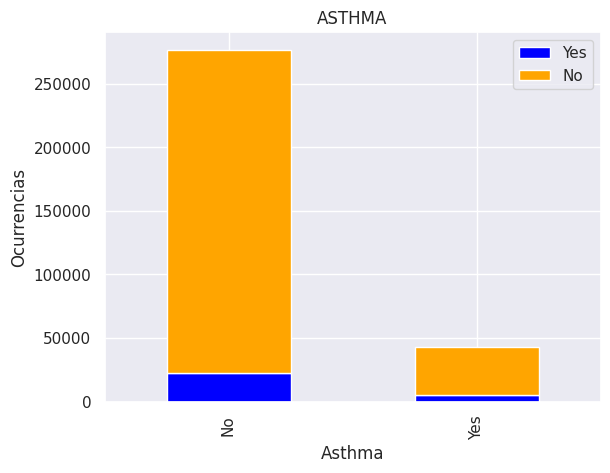

In [ ]:
barrassup('Asthma')

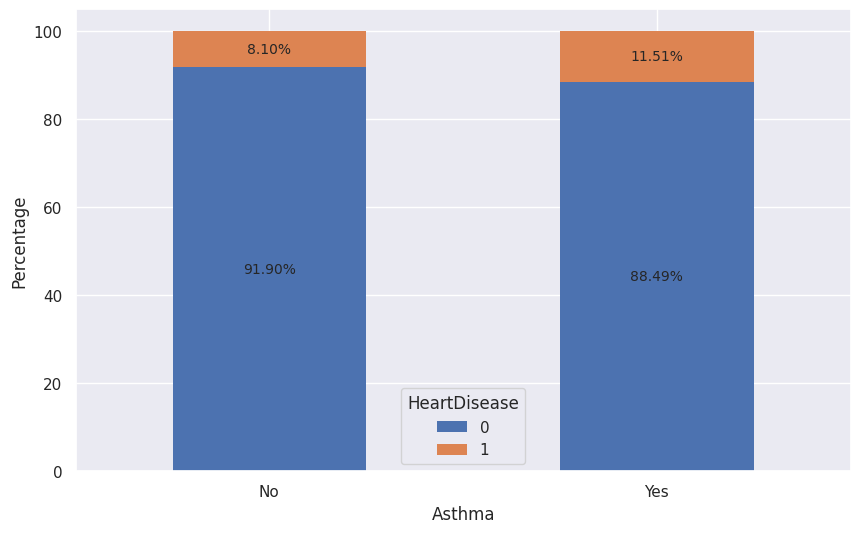

In [ ]:
stacked_bar_plot('Asthma','HeartDisease')

**Sobre Asthma**

1) En cuanto a Asthma no hay mucho para agregar mas que hay muy baja población con Asthma, y que se ve una tendencia muy grande a presentar problemas de corazón en los pacientes con Asthma ya que se nota un 4% mas de ocurrencias en las personas que cuentan con la afección respiratoria.

### Kidney Disease

Kidney Disease es una variable categorica que muestra si cada encuestado padece o una enfermedad en los riñones.

               Positives  Negatives  Totals
KidneyDisease                              
No                 23918     284098  308016
Yes                 3455       8324   11779




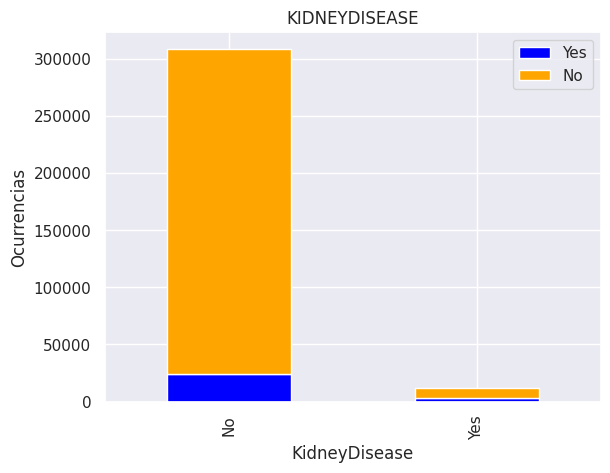

In [ ]:
barrassup('KidneyDisease')

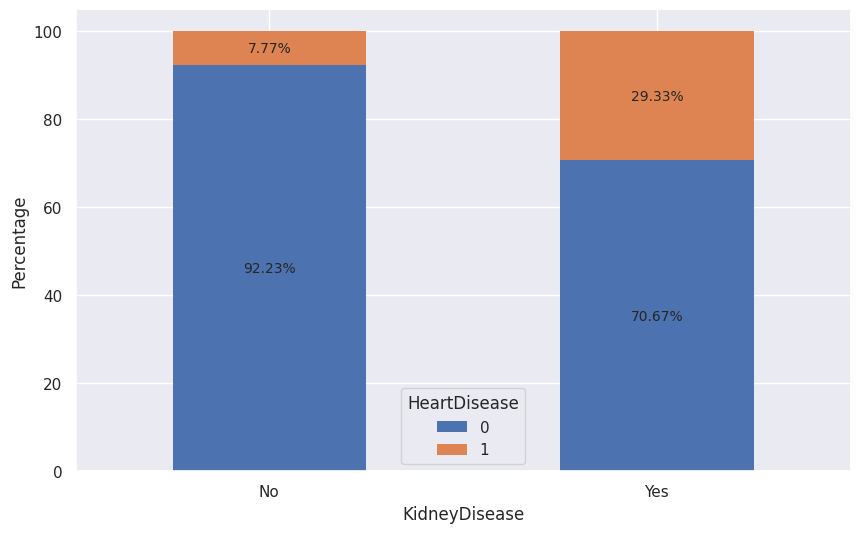

In [ ]:
stacked_bar_plot('KidneyDisease','HeartDisease')

**Sobre KidneyDisease**

1) En cuanto a enfermedades en los riñones vemos que hay una clara tendencia (casi 4 veces más frecuente) que al contar con enfermedad de riñones el paciente tenga problemas en el corazón. 

2) La cantidad de pacientes con enfermedades renales es un porcentaje muy bajo de la población total en porcentaje, alrededor de 12 mil personas.

### Skin Cancer

Esta variable es una variable categorica que indica si la persona en cuestion padece o no cancer de piel.

            Positives  Negatives  Totals
SkinCancer                              
No              22393     267583  289976
Yes              4980      24839   29819




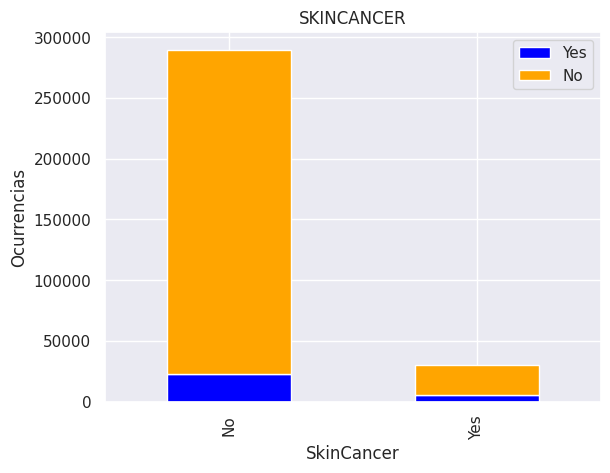

In [ ]:
barrassup('SkinCancer')

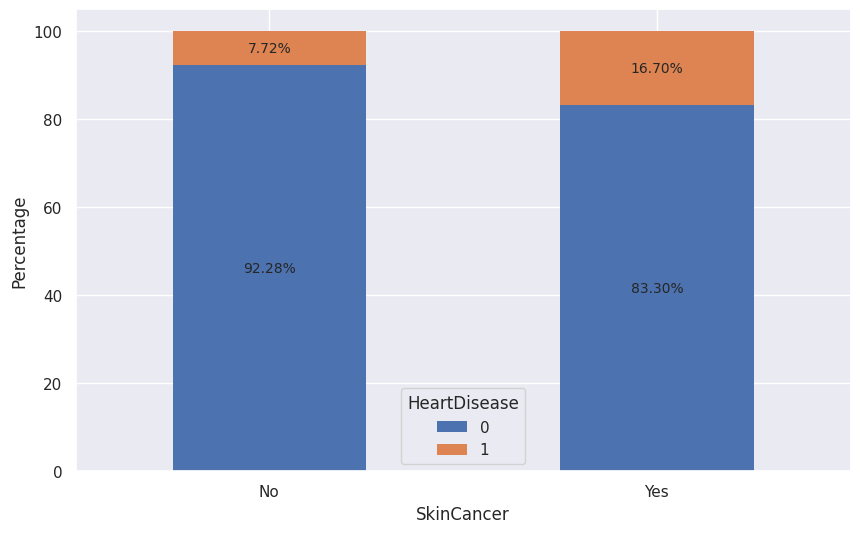

In [ ]:
stacked_bar_plot('SkinCancer','HeartDisease')

**Sobre SkinCancer**

1) Se observa que el 10% de los pacientes afirman padecer de cancer de piel.

2) Similar a los problemas renales hay una tendencia a desarrollar enfermedades del corazón si se tiene cancer de piel ya que es practicamente el doble de frecuente (porcentualmente).

## 4. **Transformación de los Datos**

Generaremos dummie variables para las columnas de race, sex, agecategory y genhealth. Ademas, escalaremos los datos para que puedan ser mejor procesados luego por nuestros modelos.

In [ ]:
df

,HeartDisease,BMI,Smoking,AlcoholDrinking,Stroke,PhysicalHealth,MentalHealth,DiffWalking,Sex,AgeCategory,Race,Diabetic,PhysicalActivity,GenHealth,SleepTime,Asthma,KidneyDisease,SkinCancer
0,0,16.60,Yes,No,No,3.0,30.0,No,Female,55-59,White,Yes,Yes,Very good,5.0,Yes,No,Yes
1,0,20.34,No,No,Yes,0.0,0.0,No,Female,80 or older,White,No,Yes,Very good,7.0,No,No,No
2,0,26.58,Yes,No,No,20.0,30.0,No,Male,65-69,White,Yes,Yes,Fair,8.0,Yes,No,No
3,0,24.21,No,No,No,0.0,0.0,No,Female,75-79,White,No,No,Good,6.0,No,No,Yes
4,0,23.71,No,No,No,28.0,0.0,Yes,Female,40-44,White,No,Yes,Very good,8.0,No,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
319790,1,27.41,Yes,No,No,7.0,0.0,Yes,Male,60-64,Hispanic,Yes,No,Fair,6.0,Yes,No,No
319791,0,29.84,Yes,No,No,0.0,0.0,No,Male,35-39,Hispanic,No,Yes,Very good,5.0,Yes,No,No
319792,0,24.24,No,No,No,0.0,0.0,No,Female,45-49,Hispanic,No,Yes,Good,6.0,No,No,No
319793,0,32.81,No,No,No,0.0,0.0,No,Female,25-29,Hispanic,No,No,Good,12.0,No,No,No


In [ ]:
df['Smoking'] = pd.Series(np.where(df.Smoking.values == 'Yes', 1, 0),df.index)
df['AlcoholDrinking'] = pd.Series(np.where(df.AlcoholDrinking.values == 'Yes', 1, 0),df.index)
df['Stroke'] = pd.Series(np.where(df.Stroke.values == 'Yes', 1, 0),df.index)
df['DiffWalking'] = pd.Series(np.where(df.DiffWalking.values == 'Yes', 1, 0),df.index)
df['Diabetic'] = pd.Series(np.where(df.Diabetic.values == 'Yes', 1, 0),df.index)
df['PhysicalActivity'] = pd.Series(np.where(df.PhysicalActivity.values == 'Yes', 1, 0),df.index)
df['Asthma'] = pd.Series(np.where(df.Asthma.values == 'Yes', 1, 0),df.index)
df['KidneyDisease'] = pd.Series(np.where(df.KidneyDisease.values == 'Yes', 1, 0),df.index)
df['SkinCancer'] = pd.Series(np.where(df.SkinCancer.values == 'Yes', 1, 0),df.index)

In [ ]:
df_dummies = pd.get_dummies(df)

In [ ]:
pd.set_option('display.max_columns', None)
df_dummies.head()

,HeartDisease,BMI,Smoking,AlcoholDrinking,Stroke,PhysicalHealth,MentalHealth,DiffWalking,Diabetic,PhysicalActivity,SleepTime,Asthma,KidneyDisease,SkinCancer,Sex_Female,Sex_Male,AgeCategory_18-24,AgeCategory_25-29,AgeCategory_30-34,AgeCategory_35-39,AgeCategory_40-44,AgeCategory_45-49,AgeCategory_50-54,AgeCategory_55-59,AgeCategory_60-64,AgeCategory_65-69,AgeCategory_70-74,AgeCategory_75-79,AgeCategory_80 or older,Race_American Indian/Alaskan Native,Race_Asian,Race_Black,Race_Hispanic,Race_Other,Race_White,GenHealth_Excellent,GenHealth_Fair,GenHealth_Good,GenHealth_Poor,GenHealth_Very good
0,0,16.60,1,0,0,3.0,30.0,0,1,1,5.0,1,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1
1,0,20.34,0,0,1,0.0,0.0,0,0,1,7.0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1
2,0,26.58,1,0,0,20.0,30.0,0,1,1,8.0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0
3,0,24.21,0,0,0,0.0,0.0,0,0,0,6.0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0
4,0,23.71,0,0,0,28.0,0.0,1,0,1,8.0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1


## 5. **Separación Train y Test**

In [ ]:
X = df_dummies.drop('HeartDisease',axis=1)
y = df_dummies['HeartDisease']

In [ ]:
X_train,X_test,y_train,y_test = train_test_split(X,y, test_size=0.3, random_state= 10, stratify=y)

In [ ]:
y_train.value_counts()

0    204695
1     19161
Name: HeartDisease, dtype: int64

In [ ]:
y_test.value_counts()

0    87727
1     8212
Name: HeartDisease, dtype: int64

> Existe un claro desbalance entre las clases, solo al rededor del 10% de los casos registrados tiene un Heart Disease. 

## 6. **Escalado de datos**

In [ ]:
scaler = MinMaxScaler()

In [ ]:
scaler.fit(X_train)

MinMaxScaler()

In [ ]:
columns_train = X_train.columns
index_train = X_train.index

X_train = scaler.transform(X_train)
X_train = pd.DataFrame(X_train,columns=columns_train,index=index_train)

In [ ]:
X_train

,BMI,Smoking,AlcoholDrinking,Stroke,PhysicalHealth,MentalHealth,DiffWalking,Diabetic,PhysicalActivity,SleepTime,Asthma,KidneyDisease,SkinCancer,Sex_Female,Sex_Male,AgeCategory_18-24,AgeCategory_25-29,AgeCategory_30-34,AgeCategory_35-39,AgeCategory_40-44,AgeCategory_45-49,AgeCategory_50-54,AgeCategory_55-59,AgeCategory_60-64,AgeCategory_65-69,AgeCategory_70-74,AgeCategory_75-79,AgeCategory_80 or older,Race_American Indian/Alaskan Native,Race_Asian,Race_Black,Race_Hispanic,Race_Other,Race_White,GenHealth_Excellent,GenHealth_Fair,GenHealth_Good,GenHealth_Poor,GenHealth_Very good
207685,0.208374,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.260870,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
246746,0.284245,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,1.0,0.304348,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
82755,0.299976,0.0,0.0,0.0,0.0,0.000000,0.0,1.0,0.0,0.304348,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
98863,0.173645,1.0,0.0,0.0,0.0,0.000000,0.0,1.0,0.0,0.260870,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
289119,0.208979,0.0,0.0,1.0,1.0,0.000000,1.0,0.0,0.0,0.130435,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
124040,0.540416,1.0,0.0,0.0,1.0,1.000000,1.0,0.0,0.0,0.130435,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
238817,0.215634,0.0,0.0,0.0,0.0,0.666667,0.0,0.0,1.0,0.217391,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
224820,0.225799,1.0,0.0,0.0,0.0,0.000000,0.0,0.0,1.0,0.260870,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
147176,0.337851,1.0,0.0,0.0,0.0,1.000000,1.0,0.0,1.0,0.304348,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0


In [ ]:
columns_test = X_test.columns
index_test = X_test.index


X_test = scaler.transform(X_test)
X_test = pd.DataFrame(X_test, columns= columns_test ,index= index_test)

In [ ]:
X_test

,BMI,Smoking,AlcoholDrinking,Stroke,PhysicalHealth,MentalHealth,DiffWalking,Diabetic,PhysicalActivity,SleepTime,Asthma,KidneyDisease,SkinCancer,Sex_Female,Sex_Male,AgeCategory_18-24,AgeCategory_25-29,AgeCategory_30-34,AgeCategory_35-39,AgeCategory_40-44,AgeCategory_45-49,AgeCategory_50-54,AgeCategory_55-59,AgeCategory_60-64,AgeCategory_65-69,AgeCategory_70-74,AgeCategory_75-79,AgeCategory_80 or older,Race_American Indian/Alaskan Native,Race_Asian,Race_Black,Race_Hispanic,Race_Other,Race_White,GenHealth_Excellent,GenHealth_Fair,GenHealth_Good,GenHealth_Poor,GenHealth_Very good
74267,0.087609,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,1.0,0.304348,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0
202606,0.111810,1.0,0.0,0.0,0.033333,0.000000,0.0,0.0,1.0,0.304348,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
142757,0.223863,1.0,0.0,0.0,0.000000,0.066667,0.0,0.0,1.0,0.217391,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
207689,0.253630,1.0,0.0,0.0,0.000000,0.000000,0.0,0.0,1.0,0.217391,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
131013,0.279889,0.0,0.0,0.0,0.033333,0.033333,0.0,0.0,1.0,0.304348,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
77432,0.141699,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,1.0,0.260870,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0
242550,0.197120,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,1.0,0.304348,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
201046,0.206922,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,1.0,0.304348,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
41301,0.208616,0.0,0.0,0.0,0.100000,0.666667,0.0,1.0,1.0,0.217391,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


## 7. **Entrenamiento de modelos**

> Entrenaremos distintos modelos de clasificación para intentar predecir nuestra variable objetivo de la mejor manera posible.


### Logistic Regression

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
from sklearn.metrics import classification_report

In [ ]:
#split dataset in features and target variable
feature_cols = ['BMI', 'Smoking',	'AlcoholDrinking',	'Stroke',	'PhysicalHealth',	'MentalHealth',	'DiffWalking',	'Sex_Female', 'Sex_Male',	'AgeCategory_18-24', 'AgeCategory_25-29', 'AgeCategory_30-34', 'AgeCategory_35-39', 'AgeCategory_40-44', 'AgeCategory_45-49', 'AgeCategory_50-54', 'AgeCategory_55-59', 'AgeCategory_60-64', 'AgeCategory_65-69', 'AgeCategory_70-74', 'AgeCategory_75-79', 'AgeCategory_80 or older',	'Race_American Indian/Alaskan Native', 'Race_Asian', 'Race_Black', 'Race_Hispanic', 'Race_Other', 'Race_White',	'Diabetic',	'PhysicalActivity',	'GenHealth_Excellent', 'GenHealth_Fair', 'GenHealth_Good', 'GenHealth_Poor', 'GenHealth_Very good',	'SleepTime',	'Asthma',	'KidneyDisease',	'SkinCancer']
X_train = X_train[feature_cols]
X_test = X_test[feature_cols] 

In [ ]:
# instantiate the model (using the default parameters)
logreg = LogisticRegression(random_state=16)
# fit the model with data
logreg.fit(X_train, y_train)
y_pred = logreg.predict(X_test)

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



In [ ]:
y_test.value_counts(normalize=True)

0    0.914404
1    0.085596
Name: HeartDisease, dtype: float64

In [ ]:
cnf_matrix = metrics.confusion_matrix(y_test, y_pred)
cnf_matrix

array([[87006,   721],
       [ 7374,   838]])

> De la matriz de confusión, observamos que 87006 y 838 son predicciones correctas y que 7374 y 721 son predicciones incorrectas.

**Visualizing Confusion Matrix using Heatmap**

Text(0.5, 427.9555555555555, 'Predicted label')

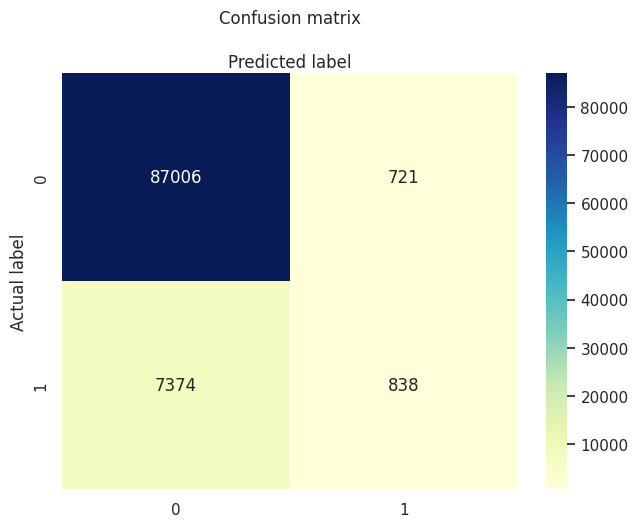

In [ ]:
class_names=[0,1] # name  of classes
fig, ax = plt.subplots()
tick_marks = np.arange(len(class_names))
plt.xticks(tick_marks, class_names)
plt.yticks(tick_marks, class_names)
# create heatmap
sns.heatmap(pd.DataFrame(cnf_matrix), annot=True, cmap="YlGnBu" ,fmt='g')
ax.xaxis.set_label_position("top")
plt.tight_layout()
plt.title('Confusion matrix', y=1.1)
plt.ylabel('Actual label')
plt.xlabel('Predicted label')

**Confusion Matrix Evaluation Metrics**



In [ ]:
target_names = ['without HeartDisease', 'with HeartDisease']
print(classification_report(y_test, y_pred, target_names=target_names))

                      precision    recall  f1-score   support

without HeartDisease       0.92      0.99      0.96     87727
   with HeartDisease       0.54      0.10      0.17      8212

            accuracy                           0.92     95939
           macro avg       0.73      0.55      0.56     95939
        weighted avg       0.89      0.92      0.89     95939



En general el modelo obtuvo un nivel de exactitud del 92%, sin embargo, dado que en su mayoría los resultados correctos son de los individuos sin problemas cardiacos y estos son la mayor parte de los datos inciales. Cuando observamos el resultado de presición en la predicción de individuos con problemas cardiacos, el porcentaje es del 55% siendo del recall solo del 11% lo cual es bastante bajo lo que indica que el modelo no se adapta a lo que buscamos pues no esta prediciendo correctamente los casos de individuos que cuentan con problemas cardiacos lo que supone errores indeseados como decirle a alguien que padece de un problema cardiaco que esta sano.

**ROC Curve**

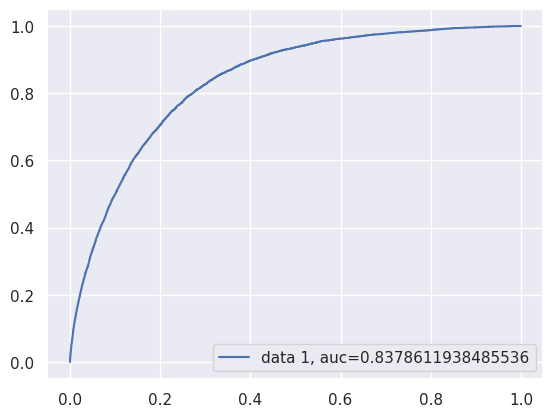

In [ ]:
y_pred_proba = logreg.predict_proba(X_test)[::,1]
fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)
auc = metrics.roc_auc_score(y_test, y_pred_proba)
plt.plot(fpr,tpr,label="data 1, auc="+str(auc))
plt.legend(loc=4)
plt.show()

Dado que hay desequilibrio en los datos no podemos tener en cuenta el valor de referencia de que el AUC sea mayor a 0,5 no es aplicable. El AUC de 0,842 refleja la presición con la que cuenta en modelo de forma general sin discriminar la cantidad de predicciones correctas de tener y de no tener problemas cardiacos.

### Linear Regression

In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import GridSearchCV

In [ ]:
LinearR=LinearRegression()
LinearR.fit(X_train,y_train)

LinearRegression()

In [ ]:
Y_pred = pd.DataFrame(LinearR.predict(X_test))

> **Comentario sobre Linear Regresion**

> Al realizar la predicción con una regresión lineal, lo que obtendremos es un score que luego del escalado quedará entre 0 y 1 sobre HeartDisease, es decir, no clasificará estrictamente a cada paciente como si o no segun si tiene una enfermedad cardiaca si no que le asignara un valor que depende de la ecuación de la regresión lineal y de los coeficientes de todas las variables, mientras más grande dicho valor más probabilidades deberia tener el paciente de tener una enfermedad cardiaca, si es que la regresión se adecua perfectamente a los datos, lo cual al tratarse de una regresión lineal es poco probable debido justamente a la restricción de la linealidad que no suele cumplirse tanto en la práctica. Analizando la distribución y para forzar una clasificación tomamos como positivo de heartdisease a todo paciente con un score mayor o igual a 0.3, y por consiguiente como negativo de heartdisease a todo paciente con un score menor a 0.3. Optamos por 0.3 debido a la distribución de los score y ya que creemos que es mejor optar por ser precabidos y que mayor porcentaje de personas se hagan estudios aunque resulte que no estan enfermos a dejar pasar por alto personas que si pueden estar enfermas. Esta metodología no es recomendada debido a que se hacen muchas suposisiones y el mismo modelo al ser lineal es escaso para el caso de estudio, aun así por cuestiones practicas nos parecio interesante incluirlo.

In [ ]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
import matplotlib as plt
import seaborn as sn
from sklearn.metrics import classification_report
from scipy.stats import boxcox 


In [ ]:
scaler.fit(Y_pred)

MinMaxScaler()

In [ ]:
Y_pred = scaler.transform(Y_pred)

In [ ]:
Y_pred = pd.DataFrame(Y_pred, columns=['score'])

array([[<Axes: title={'center': 'score'}>]], dtype=object)

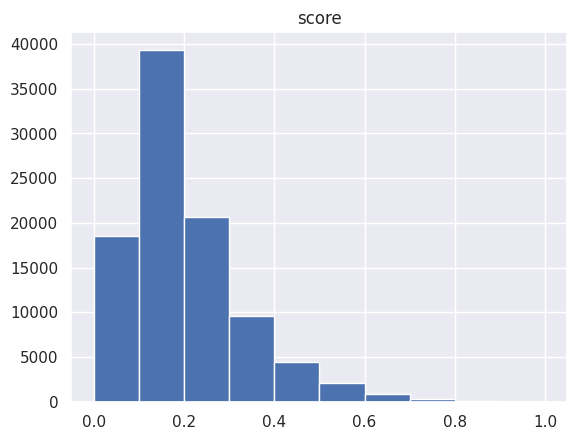

In [ ]:
Y_pred.hist()

In [ ]:
Y_pred['score'] = np.where(Y_pred['score'] < 0.3, 0, 1)

In [ ]:
Y_pred = Y_pred.to_numpy()

In [ ]:
conf_matrix = confusion_matrix(y_test, Y_pred)

In [ ]:
conf_matrix

array([[75175, 12552],
       [ 3345,  4867]])

<Axes: >

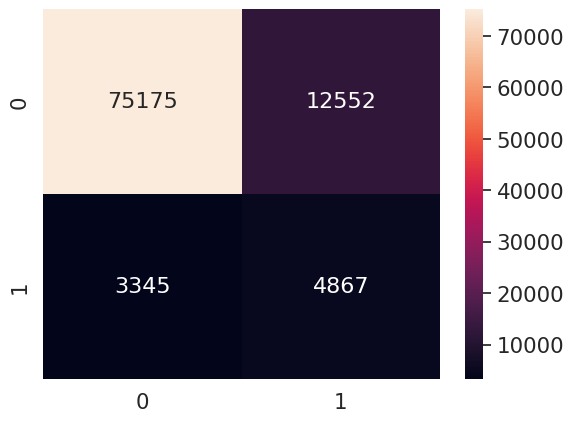

In [ ]:
sn.set(font_scale=1.4) # for label size
sn.heatmap(conf_matrix, annot=True, annot_kws={"size": 16}, fmt ='g') # font size

In [ ]:
print(classification_report(y_test, Y_pred))

              precision    recall  f1-score   support

           0       0.96      0.86      0.90     87727
           1       0.28      0.59      0.38      8212

    accuracy                           0.83     95939
   macro avg       0.62      0.72      0.64     95939
weighted avg       0.90      0.83      0.86     95939



### Nearest Centroid

In [ ]:
from sklearn.neighbors import NearestCentroid

In [ ]:
param_grid = {
    'shrink_threshold': [None, 0.1, 0.2, 0.3, 0.4, 0.5]
}

In [ ]:
nc = NearestCentroid()

In [ ]:
# Perform grid search to find the best parameter
grid_search = GridSearchCV(nc, param_grid, cv=5)
grid_search.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=NearestCentroid(),
             param_grid={'shrink_threshold': [None, 0.1, 0.2, 0.3, 0.4, 0.5]})

In [ ]:
best_param = grid_search.best_params_
best_score = grid_search.best_score_
print(best_param)
print(best_score)

{'shrink_threshold': None}
0.7579738825492692


In [ ]:
nc = NearestCentroid(shrink_threshold=best_param['shrink_threshold'])
nc.fit(X_train, y_train)

NearestCentroid()

In [ ]:
y_pred = nc.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
classification_report = classification_report(y_test, y_pred)

In [ ]:
print("Best Parameter:", best_param)
print("Best Score:", best_score)
print("Accuracy:", accuracy)
print("Classification Report:\n", classification_report)

Best Parameter: {'shrink_threshold': None}
Best Score: 0.7579738825492692
Accuracy: 0.7563556009547734
Classification Report:
               precision    recall  f1-score   support

           0       0.96      0.76      0.85     87727
           1       0.21      0.69      0.33      8212

    accuracy                           0.76     95939
   macro avg       0.59      0.73      0.59     95939
weighted avg       0.90      0.76      0.81     95939



### Naive Bayes

In [ ]:
from sklearn.naive_bayes import GaussianNB

In [ ]:
Naive= GaussianNB()

In [ ]:
param_grid = {
    'var_smoothing': [1e-9, 1e-8, 1e-7, 1e-6, 1e-5]
}

Naive_GS = GridSearchCV(estimator= Naive, param_grid=param_grid, cv=5)
Naive_GS.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=GaussianNB(),
             param_grid={'var_smoothing': [1e-09, 1e-08, 1e-07, 1e-06, 1e-05]})

In [ ]:
Y_pred = Naive_GS.predict(X_test)

In [ ]:
conf_matrix = confusion_matrix(y_test, Y_pred)

<Axes: >

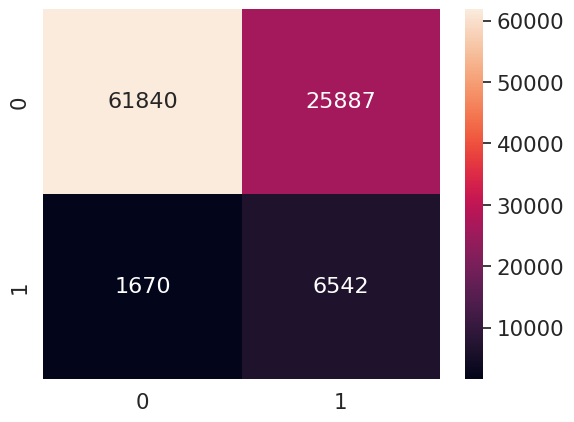

In [ ]:
sn.set(font_scale=1.4) # for label size
sn.heatmap(conf_matrix, annot=True, annot_kws={"size": 16}, fmt ='g') # font size

In [ ]:
from sklearn.metrics import classification_report

In [ ]:
print(classification_report(y_test, Y_pred))

              precision    recall  f1-score   support

           0       0.97      0.70      0.82     87727
           1       0.20      0.80      0.32      8212

    accuracy                           0.71     95939
   macro avg       0.59      0.75      0.57     95939
weighted avg       0.91      0.71      0.78     95939



### Decision Trees

In [ ]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import get_scorer_names
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.preprocessing import PolynomialFeatures
from sklearn.datasets import load_iris
from sklearn import tree
from sklearn.metrics import accuracy_score
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix

import graphviz

In [ ]:
param_grid = {'max_depth':[3,5,7,9,11,13,15]}

In [ ]:
grid = GridSearchCV(DecisionTreeClassifier(), param_grid, scoring='accuracy', n_jobs=-1, verbose=3)

In [ ]:
grid.fit(X_train,y_train)
print('Best hyperparameters: ',grid.best_params_)
print('Best mean CV score:', grid.best_score_.round(2))

Fitting 5 folds for each of 7 candidates, totalling 35 fits
Best hyperparameters:  {'max_depth': 7}
Best mean CV score: 0.92


In [ ]:
clf = tree.DecisionTreeClassifier(max_depth=7, criterion='gini', random_state=0)
clf.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=7, random_state=0)

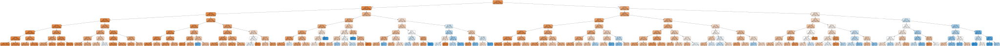

In [ ]:
dot_data = tree.export_graphviz(clf, out_file=None, 
                      filled=True, rounded=True,  
                      special_characters=True)  
graph = graphviz.Source(dot_data)
display(graph)

In [ ]:
y_pred = clf.predict(X_test)
acc = accuracy_score(y_test,y_pred).round(2)
print('Accuracy:',acc)

Accuracy: 0.91


In [ ]:
target_names = ['without HeartDisease', 'with HeartDisease']
print(classification_report(y_test, y_pred, target_names=target_names))

                      precision    recall  f1-score   support

without HeartDisease       0.92      0.99      0.96     87727
   with HeartDisease       0.50      0.07      0.13      8212

            accuracy                           0.91     95939
           macro avg       0.71      0.53      0.54     95939
        weighted avg       0.88      0.91      0.88     95939



El modelo de árbol de decisión obtuvo un nivel de exactitud del 91%. Analizando el porcentaje de verdaderos positivos, sin emabrgo, solo se tiene un 4%, lo cual significa que de cada 100 personas, aproximadas 6 serían diagnosticadas con problemas cardiacos, de las cuales solo 0.24 de los casos si sería cierto. Con esto se podría inferir que el modelo no permite predecir correctamente los casos de individuos que cuentan con problemas cardiacos.

### KNN

In [ ]:
from sklearn.neighbors import KNeighborsClassifier

In [ ]:
param_grid = {
    'n_neighbors': [3, 5],
    'weights': ['uniform', 'distance'],
    'p': [1]
}

knn = KNeighborsClassifier()
knn_cv = GridSearchCV(estimator = knn, param_grid = param_grid, cv = 5 )
knn_cv.fit(X_train, y_train)

In [ ]:
Y_pred = knn_cv.predict(X_test)

In [ ]:
conf_matrix = confusion_matrix(y_test, Y_pred)

In [ ]:
conf_matrix

In [ ]:
sn.set(font_scale=1.4) # for label size
sn.heatmap(conf_matrix, annot=True, annot_kws={"size": 16}, fmt='g') # font size

In [ ]:
print(classification_report(y_test, Y_pred))

> Debido a altos tiempos de entrenamiento, no pudimos entrenar el modelo de KNN.

### SVM

In [ ]:
from sklearn.svm import SVC

In [ ]:
svm = SVC()

#svm.fit(X_train, y_train)

In [ ]:
y_pred = svm.predict(X_test)

In [ ]:
accuracy = accuracy_score(y_test, y_pred)
classification_report = classification_report(y_test, y_pred)

print("Accuracy:", accuracy)
print("Classification Report:\n", classification_report)

> No logramos entrenar la SVM debido a tiempos de entrenamiento muy altos.

### Tree Ensembles

In [ ]:
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import BaggingClassifier, AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier

In [ ]:
param_grid_bagging = {
    'n_estimators': [5,10],
    'max_samples': [0.5, 0.8, 1.0]
}

param_grid_boosting = {
    'n_estimators': [5,10],
    'learning_rate': [0.1, 0.5, 1.0]
}

tree = DecisionTreeClassifier()

> Bagging

In [ ]:
bagging = BaggingClassifier(tree)
grid_search_bagging = GridSearchCV(bagging, param_grid_bagging, cv=5)
grid_search_bagging.fit(X_train, y_train)

GridSearchCV(cv=5,
             estimator=BaggingClassifier(estimator=DecisionTreeClassifier()),
             param_grid={'max_samples': [0.5, 0.8, 1.0],
                         'n_estimators': [5, 10]})

> Boosting

In [ ]:
boosting = AdaBoostClassifier(tree)
grid_search_boosting = GridSearchCV(boosting, param_grid_boosting, cv=5)
grid_search_boosting.fit(X_train, y_train)


GridSearchCV(cv=5,
             estimator=AdaBoostClassifier(estimator=DecisionTreeClassifier()),
             param_grid={'learning_rate': [0.1, 0.5, 1.0],
                         'n_estimators': [5, 10]})

In [ ]:
# Create and train the best ones:

best_params_bagging = grid_search_bagging.best_params_
best_score_bagging = grid_search_bagging.best_score_

best_params_boosting = grid_search_boosting.best_params_
best_score_boosting = grid_search_boosting.best_score_

bagging = BaggingClassifier(tree, **best_params_bagging)
boosting = AdaBoostClassifier(tree, **best_params_boosting)

In [ ]:
bagging.fit(X_train, y_train)

BaggingClassifier(estimator=DecisionTreeClassifier(), max_samples=0.5)

In [ ]:
boosting.fit(X_train, y_train)

AdaBoostClassifier(estimator=DecisionTreeClassifier(), learning_rate=0.1,
                   n_estimators=10)

In [ ]:
# Predict and evaluate

y_pred_bagging = bagging.predict(X_test)
y_pred_boosting = boosting.predict(X_test)

In [ ]:
from sklearn.metrics import classification_report

# Evaluate the Bagging classifier
accuracy_bagging = accuracy_score(y_test, y_pred_bagging)
classification_report_bagging = classification_report(y_test, y_pred_bagging)
print("Bagging - Best Parameters:", best_params_bagging)
print("Bagging - Best Score:", best_score_bagging)
print("Bagging - Accuracy:", accuracy_bagging)
print("Bagging - Classification Report:\n", classification_report_bagging)

Bagging - Best Parameters: {'max_samples': 0.5, 'n_estimators': 10}
Bagging - Best Score: 0.9080524965703797
Bagging - Accuracy: 0.9061070054930738
Bagging - Classification Report:
               precision    recall  f1-score   support

           0       0.92      0.98      0.95     87727
           1       0.34      0.11      0.16      8212

    accuracy                           0.91     95939
   macro avg       0.63      0.54      0.56     95939
weighted avg       0.87      0.91      0.88     95939



In [ ]:
# Evaluate the Boosting classifier
accuracy_boosting = accuracy_score(y_test, y_pred_boosting)
classification_report_boosting = classification_report(y_test, y_pred_boosting)
print("Boosting - Best Parameters:", best_params_boosting)
print("Boosting - Best Score:", best_score_boosting)
print("Boosting - Accuracy:", accuracy_boosting)
print("Boosting - Classification Report:\n", classification_report_boosting)

Boosting - Best Parameters: {'learning_rate': 0.1, 'n_estimators': 10}
Boosting - Best Score: 0.893945212058554
Boosting - Accuracy: 0.894255724991922
Boosting - Classification Report:
               precision    recall  f1-score   support

           0       0.92      0.96      0.94     87727
           1       0.28      0.15      0.20      8212

    accuracy                           0.89     95939
   macro avg       0.60      0.56      0.57     95939
weighted avg       0.87      0.89      0.88     95939



### Polinomial Regression

In [ ]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.metrics import accuracy_score
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix

Se considera el X_train como una dataset nuevo, del cual se vuelve a partir en un X_train1 y X_test1, para poder evaluar el grado que ofrece una mejor precisión, prefieriendo siempre el menor grado posible

In [ ]:
X1 = X_train.sample(n=1000)
y1 = y_train.sample(n=1000)

In [ ]:
X_train1,X_test1,y_train1,y_test1 = train_test_split(X1,y1,test_size=0.3,random_state=10,stratify=y1)

Se debe probar diferentes grados para ver cual grado es el más sencillo y el más preciso.

In [ ]:
poly_features_d1 = PolynomialFeatures(degree=1)

X_poly = poly_features_d1.fit_transform(X_train1)

model = LogisticRegression()
model.fit(X_poly, y_train1)

X_test = np.linspace(-5, 5, 100).reshape(-1, 1)
X_test_poly = poly_features_d1.transform(X_test1)
y_pred = model.predict(X_test_poly)

acc = accuracy_score(y_test1,y_pred).round(2)
print('Accuracy:',acc)

Accuracy: 0.91


In [ ]:
poly_features = PolynomialFeatures(degree=2)

X_poly = poly_features.fit_transform(X_train1)

model = LogisticRegression()
model.fit(X_poly, y_train1)

X_test = np.linspace(-5, 5, 100).reshape(-1, 1)
X_test_poly = poly_features.transform(X_test1)
y_pred = model.predict(X_test_poly)

acc = accuracy_score(y_test1,y_pred).round(2)
print('Accuracy:',acc)

Accuracy: 0.9


In [ ]:
poly_features = PolynomialFeatures(degree=3)

X_poly = poly_features.fit_transform(X_train1)

model = LogisticRegression()
model.fit(X_poly, y_train1)

X_test = np.linspace(-5, 5, 100).reshape(-1, 1)
X_test_poly = poly_features.transform(X_test1)
y_pred = model.predict(X_test_poly)

acc = accuracy_score(y_test1,y_pred).round(2)
print('Accuracy:',acc)

Accuracy: 0.87


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



In [ ]:
poly_features = PolynomialFeatures(degree=4)

X_poly = poly_features.fit_transform(X_train1)

model = LogisticRegression()
model.fit(X_poly, y_train1)

X_test = np.linspace(-5, 5, 100).reshape(-1, 1)
X_test_poly = poly_features.transform(X_test1)
y_pred = model.predict(X_test_poly)

acc = accuracy_score(y_test1,y_pred).round(2)
print('Accuracy:',acc)

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



Accuracy: 0.86


Se elige el grado 1 y se entrena en el X_train y se prueba en el X_test

In [ ]:
poly_features_d1 = PolynomialFeatures(degree=1)

X_poly = poly_features_d1.fit_transform(X_train1)

model = LogisticRegression()
model.fit(X_poly, y_train1)

X_test = np.linspace(-5, 5, 100).reshape(-1, 1)
X_test_poly = poly_features_d1.transform(X_test1)
y_pred = model.predict(X_test_poly)

acc = accuracy_score(y_test1,y_pred).round(2)
print('Accuracy:',acc)

Accuracy: 0.91


In [ ]:
clas = classification_report(y_test1,y_pred)
print(clas)

              precision    recall  f1-score   support

           0       0.91      1.00      0.95       274
           1       0.00      0.00      0.00        26

    accuracy                           0.91       300
   macro avg       0.46      0.50      0.48       300
weighted avg       0.83      0.91      0.87       300



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



# 8. **Conclusiones sobre los modelos**

Luego de entrenar varios modelos clasificadores y evaluar sus resultados, presentamos los que creemos que podrian ser los mas utiles para trabajar con el problema planteado. 

Ya que se quiere predecir una enfermedad cardiaca, que por su naturaleza puede acabar con la vida, creemos que nuestro modelo debe ser preciso, pero tambien abarcar como positivos la mayor cantidad de casos posibles (lo que se traduce en un buen balance precision - recall). De esta manera, nuestro modelo sera acertado al decir que alguien tiene un Heart Disease pero al mismo tiempo "ante la duda" clasificara casos como positivos con cierta probabilidad de estar equivocandose (Es decir, que la persona en realidad NO tenga un Heart Disease).

Creemos que esto es lo mas adecuado y que es mejor "asustar" a una persona con un diagnostico negativo antes de predecir que NO tiene una enfermadad que luego podria matarla en caso de en realidad tenerla. Desde luego este enfoque intenta preservar la maxima precision posible, dentro de este poder de alto abarcamiento, para que estos casos limites de casos de falsos positivos sean lo menores posibles. 

Los resultados de los entrenamientos son los siguientes:


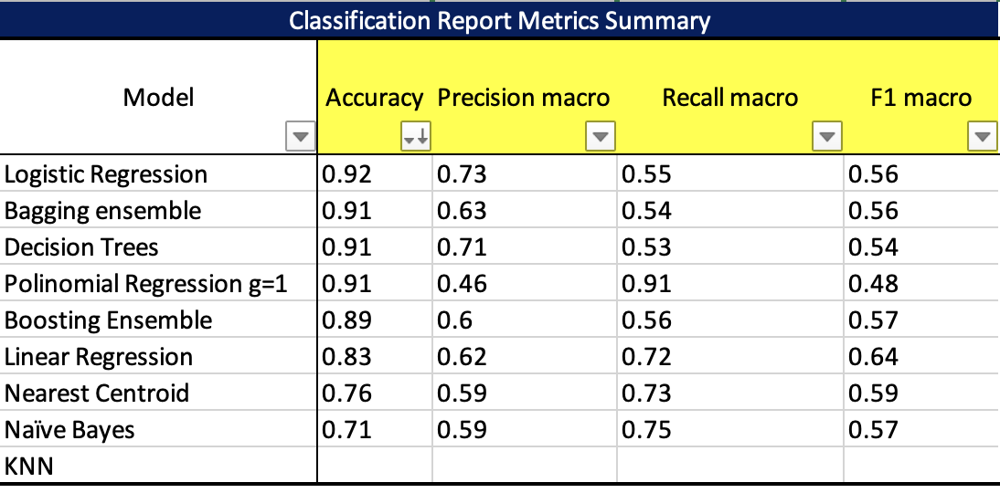

A partir de los cuales elegimos un modelo: **La Regresión Logística.**

Creemos que este modelo podria ayudar a minimizar las muertes por causas relacionadas con las enfermedades cardiacas y alentamos a quien lea este estudio a realizar mejoras sobre el mismo, incluyendo mas features, analisis de mayor profundidad y nuevas fuentes de datos. 

Si bien se trata de un caso teórico para poner en practica los conocimientos aprendidos en el curso, es importante destacar el potencial práctico real que tienen estas técnicas y que cada vez son mas utilizadas en la industria para solucionar, predecir y mejorar problematicas de los Seres Humanos.

Tambien se recomienda estudiar el impacto de tecnicas de tratamiento de datasets desbalanceados como SMOTE(Synthetic Minority Over-sampling Technique), undersampling y oversampling simple y otras tecnicas que podrian mejorar la performance de los modelos desde un enfoque data-centric.
